# Namestitev knjižnic in okolja

In [1]:
!pip install inference-sdk --ignore-requires-python
!pip install supervision opencv-python
!pip install umap-learn scikit-learn transformers

!pip install -q git+https://github.com/roboflow/sports.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.5/99.5 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 33.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.1/73.1 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 376.6/376.6 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.9/104.9 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.3/144.3 kB 6.1 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: pillow 11.3.0
    Uninstalling pillow-11.3.0:
      Successfully uninstalled pillow-11.3.0
  Attempting uninstall: requests
    Found existing ins

  Preparing metadata (setup.py) ... done


In [1]:
# Kloniranje in namestitev repozitorija SAM 2
!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd segment-anything-2
!pip install -e .

# Prenos uteži modela
!mkdir -p checkpoints
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt -O sam2.1_hiera_large.pt

Cloning into 'segment-anything-2'...
remote: Enumerating objects: 1107, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 1107 (delta 10), reused 4 (delta 4), pack-reused 1093 (from 2)
Receiving objects: 100% (1107/1107), 134.85 MiB | 25.97 MiB/s, done.
Resolving deltas: 100% (385/385), done.
/content/segment-anything-2
Obtaining file:///content/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.1/163.1 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.6/129.6 kB 12.0 MB/s eta 0:00:00
  Building editable for SAM-2 (pyproject.toml) ... done
  Created wheel for S

In [2]:
# 1. Uvoz standardnih knjižnic Python
from collections import Counter, defaultdict
import gc
import os
import pickle
import shutil
import sys

# 2. Nastavitev sistemske poti (sys.path)
# Izvesti se mora pred uvozom modulov iz te mape
sys.path.append("/content/segment-anything-2")

# 3. Zunanje knjižnice za matematiko in podatkovne vede
import numpy as np
from scipy.optimize import linear_sum_assignment
from sklearn.cluster import KMeans
import umap

# 4. Računalniški vid, globoko učenje in orodja za strojno učenje
import cv2
from inference_sdk import InferenceHTTPClient
from sam2.build_sam import build_sam2_video_predictor
import supervision as sv
import torch
from transformers import AutoProcessor, SiglipModel

# 5. Vizualizacija, interaktivni pripomočki in okolje Google Colab
from google.colab import userdata
from google.colab.patches import cv2_imshow
from IPython.display import display
import ipywidgets as widgets
import matplotlib.pyplot as plt

In [3]:
# Preverjanje uspešnosti uvoza modulov in razpoložljivosti CUDA
print("Modul SAM 2 je bil uspešno uvožen.")
print(f"CUDA na voljo: {torch.cuda.is_available()}")

# Varno pridobivanje ključa API iz Colab Secrets
try:
    API_KEY = userdata.get('ROBOFLOW_API_KEY')
except Exception:
    raise ValueError("Prosimo, dodajte 'ROBOFLOW_API_KEY' v zavihek Colab Secrets.")


Modul SAM 2 je bil uspešno uvožen.
CUDA na voljo: True


## Preizkus izvajanja inference

--- Začetek izvajanja inference na prvih 3 sličicah ---
Obdelava sličice 1...


/usr/local/lib/python3.13/dist-packages/inference_sdk/http/client.py:114: InferenceSDKGuidanceWarning: This client sends the Roboflow API key through the legacy channel (query parameter / request body). Sending it as the `Authorization: Bearer <api_key>` header is recommended and works with inference servers from release 1.5.0 onward. Opt in with InferenceConfiguration(api_key_transport='header'); use 'both' for a transition period safe with every server version. Set api_key_transport='legacy' explicitly to keep the current behaviour and silence this warning.
  warnings.warn(


Število najdenih detekcij: 26


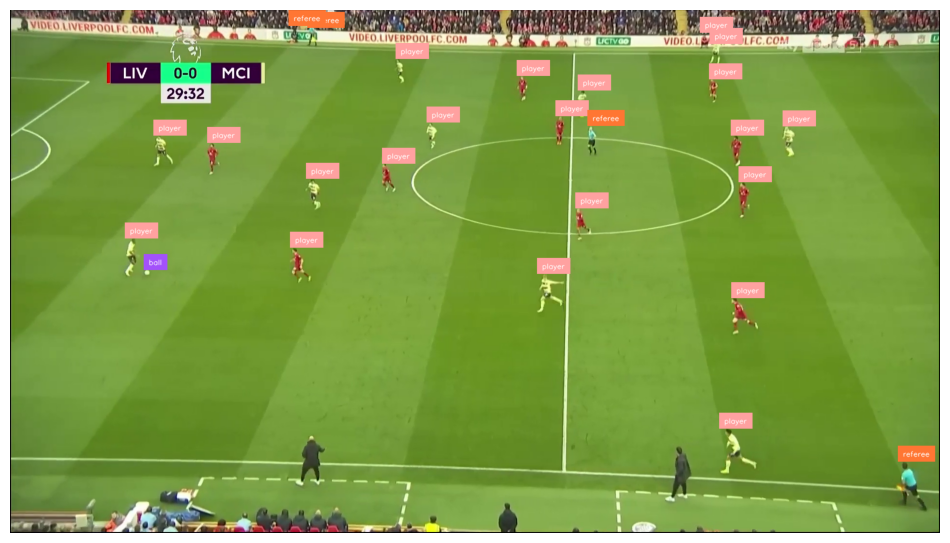

Obdelava sličice 2...
Število najdenih detekcij: 26


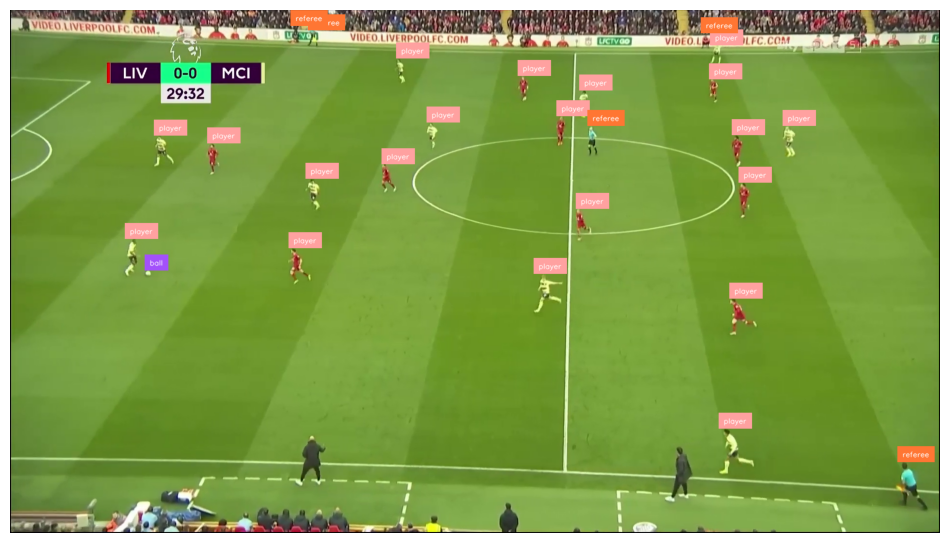

Obdelava sličice 3...
Število najdenih detekcij: 26


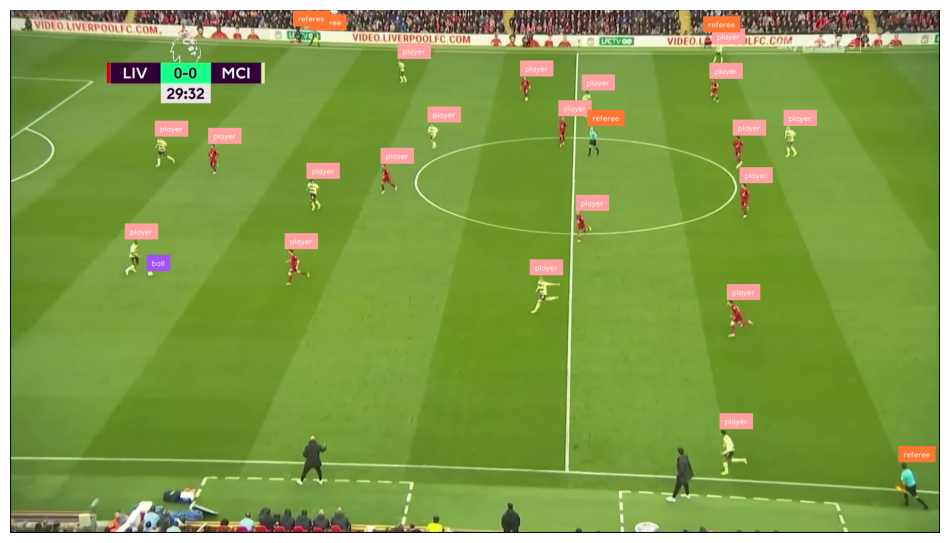

--- Preizkus zaključen ---


In [4]:
# 1. Definicija enoličnega ID-ja modela Roboflow
MODEL_ID = "football-players-detection-3zvbc-ammul/1"

# 2. Inicializacija odjemalca za inferenco (Inference Client)
client = InferenceHTTPClient(
    api_url="https://serverless.roboflow.com",
    api_key=API_KEY
)

# 3. Nalaganje videoposnetka
video_path = "/content/ars-che-shot.mp4"
cap = cv2.VideoCapture(video_path)

frame_count = 0
max_frames_to_test = 3  # Število testnih sličic za hitro preverjanje

print(f"--- Začetek izvajanja inference na prvih {max_frames_to_test} sličicah ---")

while cap.isOpened() and frame_count < max_frames_to_test:
    ret, frame = cap.read()
    if not ret:
        print("Konec videoposnetka ali datoteka ni bila najdena.")
        break

    frame_count += 1
    print(f"Obdelava sličice {frame_count}...")

    # 4. Izvajanje inference preko strežniškega API-ja Roboflow
    results = client.infer(frame, model_id=MODEL_ID)

    # 5. Pretvorba rezultatov v format Supervision za izris
    detections = sv.Detections.from_inference(results)

    # 6. Anotacija zaznanih objektov (poligoni in oznake)
    box_annotator = sv.PolygonAnnotator()
    label_annotator = sv.LabelAnnotator()

    annotated_frame = box_annotator.annotate(scene=frame.copy(), detections=detections)
    annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections)

    # 7. Prikaz obdelane sličice v beležnici
    print(f"Število najdenih detekcij: {len(detections)}")
    sv.plot_image(annotated_frame, size=(12, 12))

cap.release()
print("--- Preizkus zaključen ---")

*TRACKING* # CELICA 1: UVOZI, KONFIGURACIJA, NALAGANJE MODELOV IN SLEDENJE ŽOGE


Naprava za procesiranje: cuda
Nalagam SigLIP...


preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

[transformers] Model config: bos_token_id must be `None` or an integer within the vocabulary (between 0 and 31999), got 49406. This may result in unexpected behavior.
[transformers] Model config: eos_token_id must be `None` or an integer within the vocabulary (between 0 and 31999), got 49407. This may result in unexpected behavior.


tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model: reconstructing file:   0%|          |  0.00B /  798kB            

spiece.model: downloading bytes:           |  0.00B            

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.40M [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  813MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/408 [00:00<?, ?it/s]

Inicializacija Roboflow Inference Klienta...
Ekstrakcija slikovnih okvirjev iz videa...
Uspešno ekstrahiranih 602 okvirjev.

🌾 Korak 1: Pre-harvesting vseh surovih detekcij žoge...

🪡 Korak 2: Zaganjam končni avtomat z varovali za trajektorijo žoge...


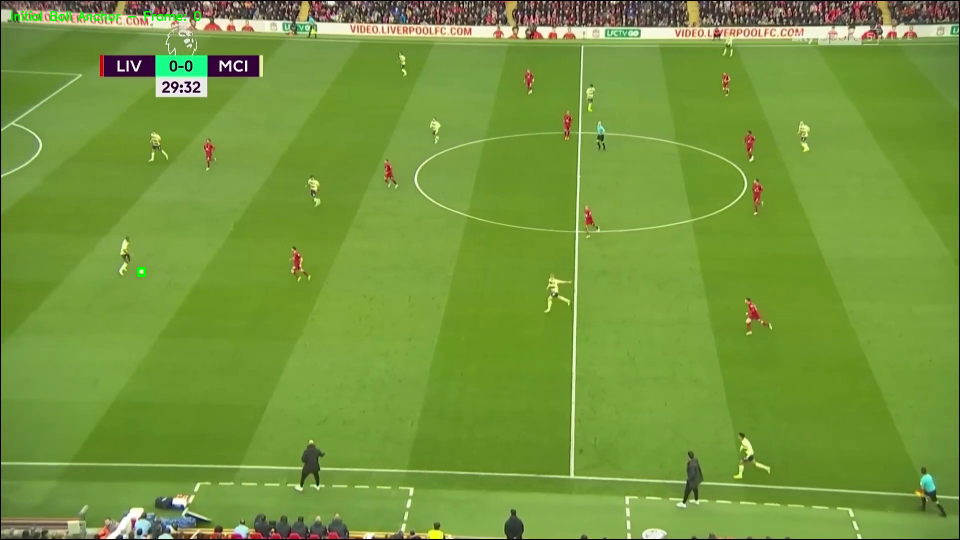

Ali je to prava žoga za začetek sledenja? (y/n): y

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 76.


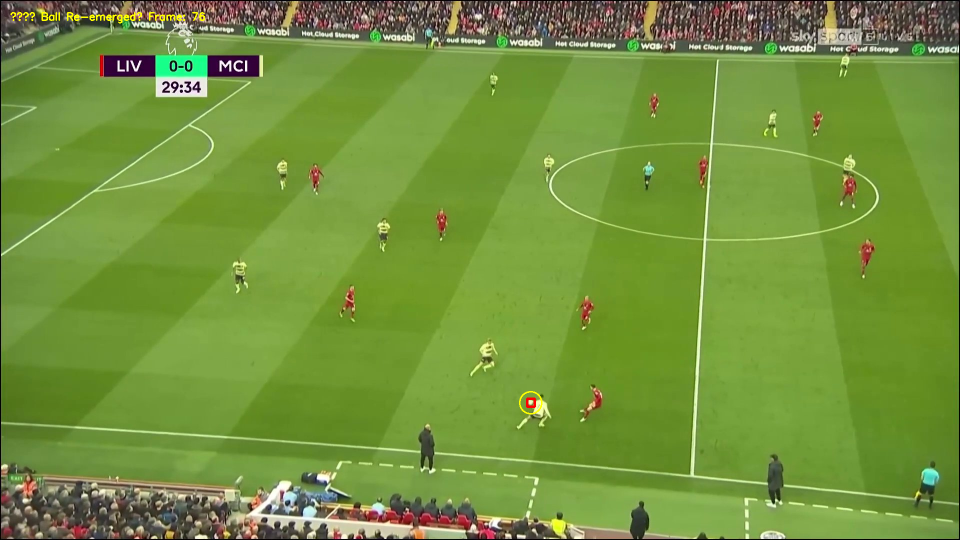

Ali je to ponovni pojav prave žoge? (y/n): y

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 213.


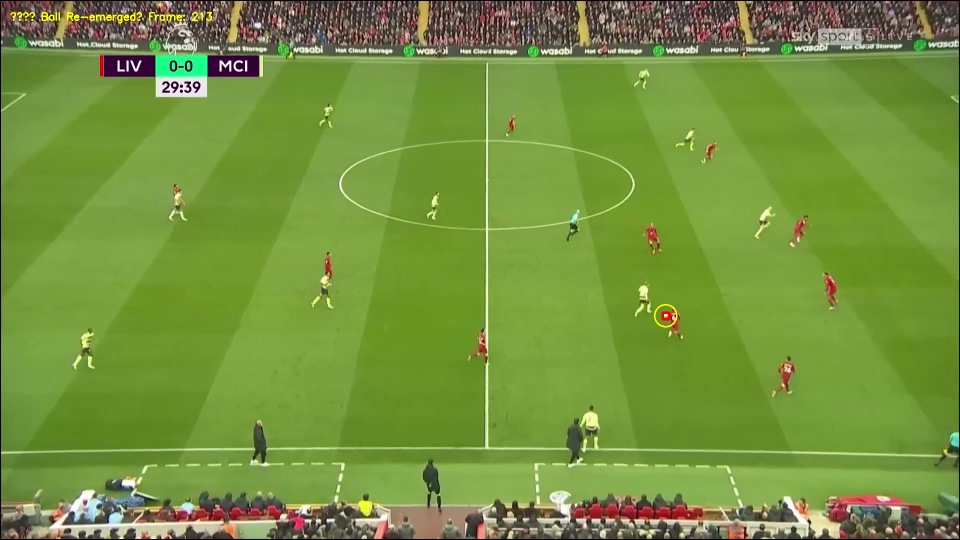

Ali je to ponovni pojav prave žoge? (y/n): y

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 361.


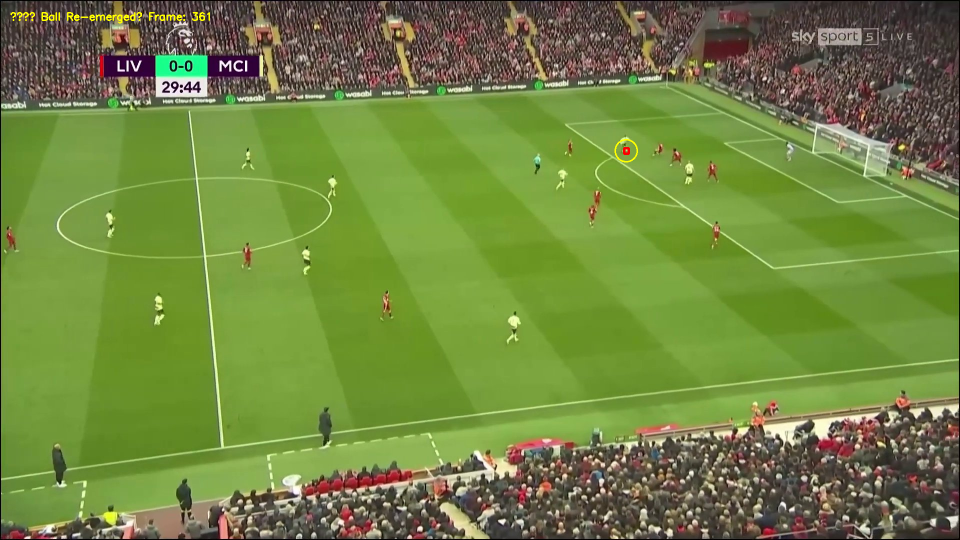

Ali je to ponovni pojav prave žoge? (y/n): y

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 410.


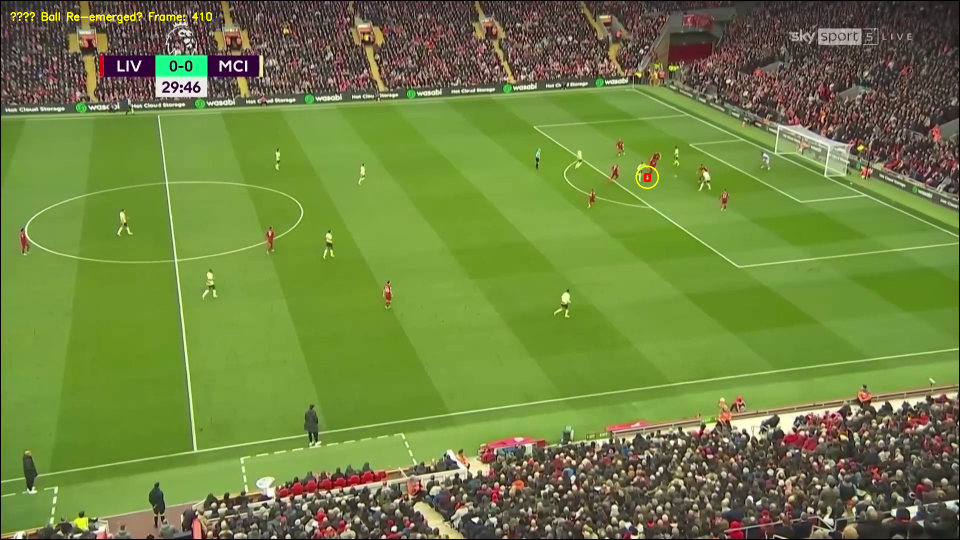

Ali je to ponovni pojav prave žoge? (y/n): y

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 431.


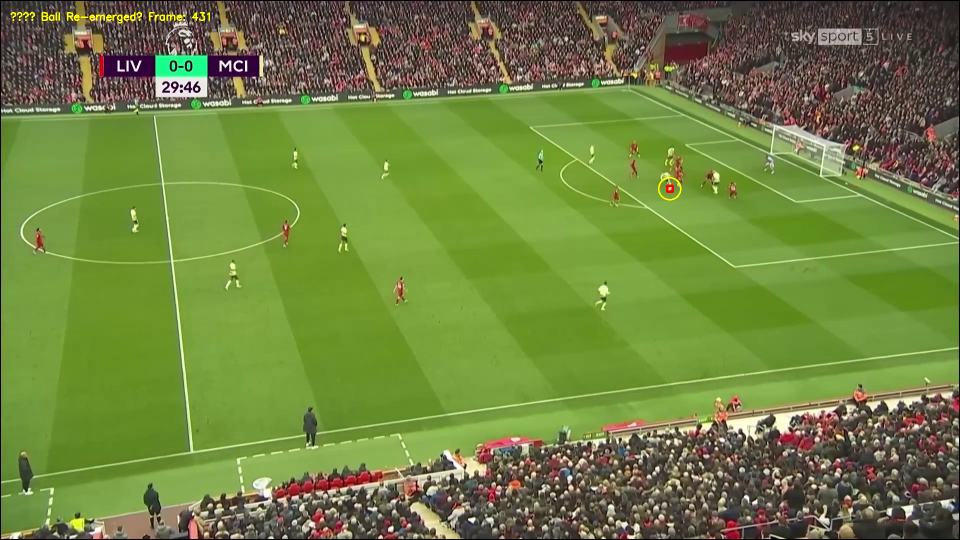

Ali je to ponovni pojav prave žoge? (y/n): y

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 450.


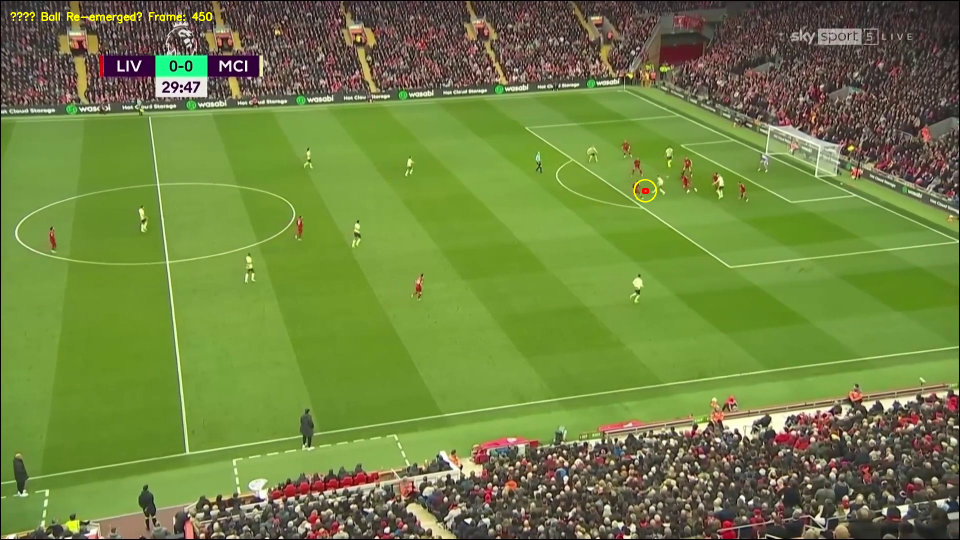

Ali je to ponovni pojav prave žoge? (y/n): y

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 534.


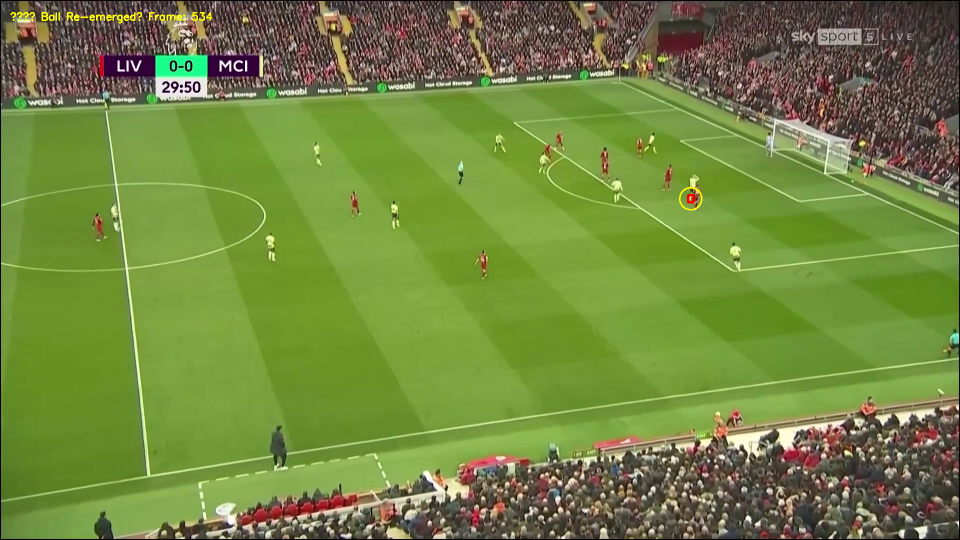

Ali je to ponovni pojav prave žoge? (y/n): n

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 535.


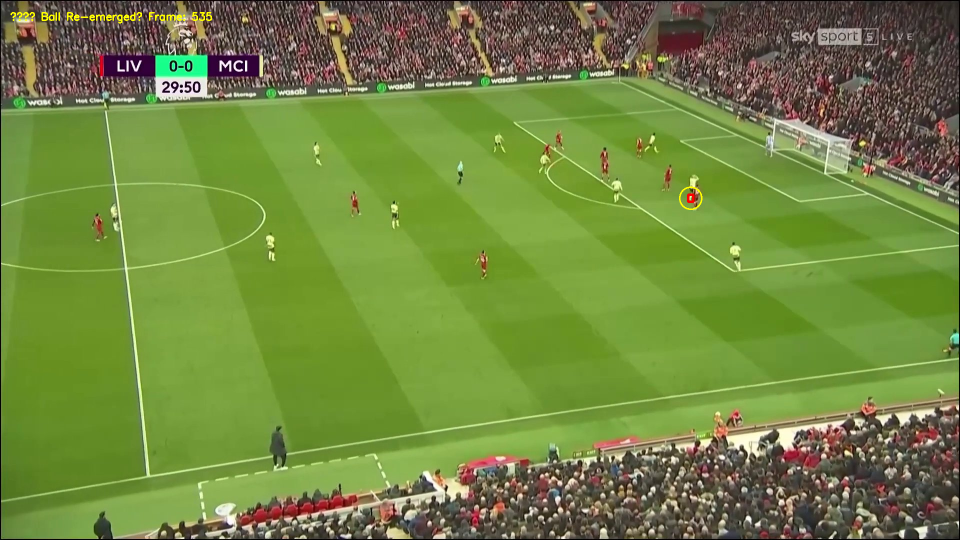

Ali je to ponovni pojav prave žoge? (y/n): n

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 536.


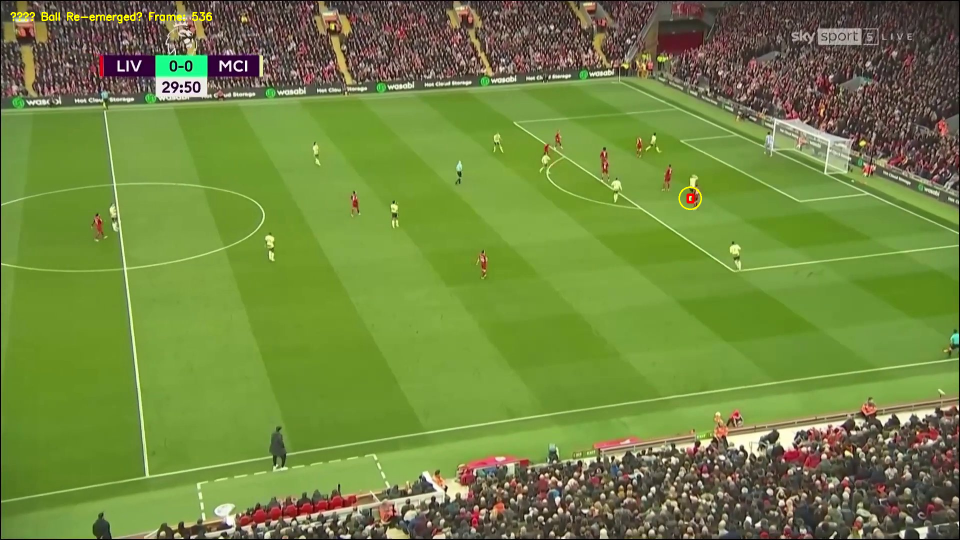

Ali je to ponovni pojav prave žoge? (y/n): n

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 537.


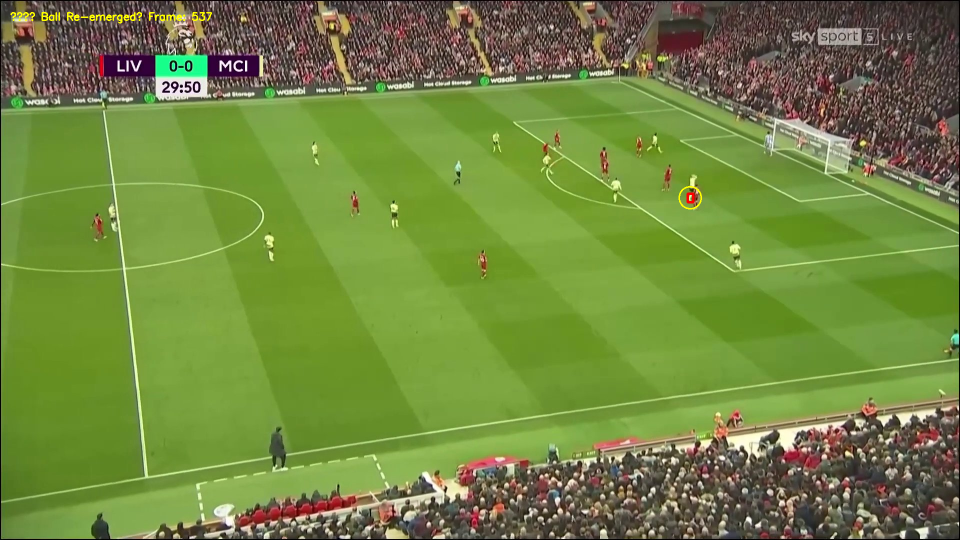

Ali je to ponovni pojav prave žoge? (y/n): n

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 538.


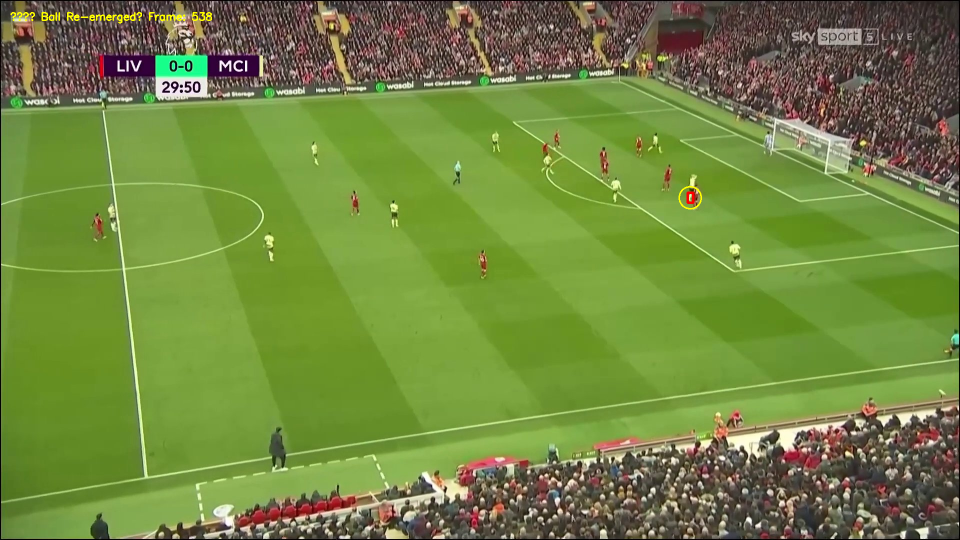

Ali je to ponovni pojav prave žoge? (y/n): n

🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju 568.


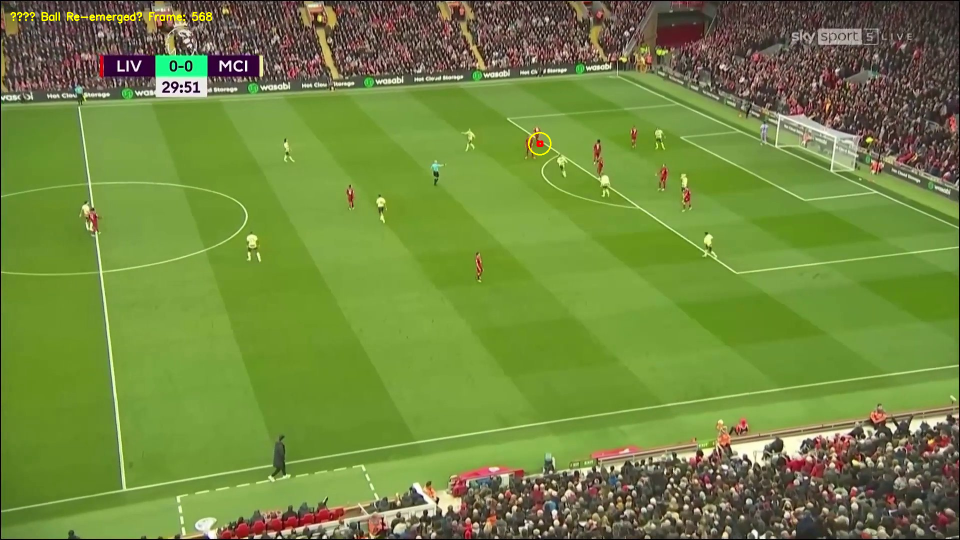

Ali je to ponovni pojav prave žoge? (y/n): n
✅ Izračunana polna trajektorija žoge za 520 okvirjev.


In [5]:
# ==============================================================================
# CELICA 1: UVOZ KNJIŽNIC, KONFIGURACIJA IN FIZIKALNO SLEDENJE ŽOGI
# ==============================================================================

import os, sys, cv2, shutil, pickle, gc
import numpy as np
import torch
import supervision as sv
from inference_sdk import InferenceHTTPClient
from sklearn.cluster import KMeans
from collections import defaultdict
import umap
from transformers import AutoProcessor, SiglipModel
from google.colab import userdata
from google.colab.patches import cv2_imshow

sys.path.append("/content/segment-anything-2")
from sam2.build_sam import build_sam2_video_predictor

# ── Adaptive Kalman Filter Class ──────────────────────────────────────────────
class KalmanBallTracker:
    def __init__(self, bbox):
        cx = (bbox[0] + bbox[2]) / 2.0
        cy = (bbox[1] + bbox[3]) / 2.0
        w  = bbox[2] - bbox[0]
        h  = bbox[3] - bbox[1]

        self.x = np.array([[cx], [cy], [w], [h], [0.0], [0.0]], dtype=np.float32)

        self.F = np.array([
            [1, 0, 0, 0, 1, 0],
            [0, 1, 0, 0, 0, 1],
            [0, 0, 1, 0, 0, 0],
            [0, 0, 0, 1, 0, 0],
            [0, 0, 0, 0, 1, 0],
            [0, 0, 0, 0, 0, 1]
        ], dtype=np.float32)

        self.H = np.array([
            [1, 0, 0, 0, 0, 0],
            [0, 1, 0, 0, 0, 0],
            [0, 0, 1, 0, 0, 0],
            [0, 0, 0, 1, 0, 0]
        ], dtype=np.float32)

        self.P = np.eye(6, dtype=np.float32) * 10.0
        self.R = np.eye(4, dtype=np.float32) * 1.5

        self.Q = np.zeros((6, 6), dtype=np.float32)
        self.Q[0:4, 0:4] = np.eye(4) * 0.2
        self.Q[4:6, 4:6] = np.eye(2) * 35.0

    def predict(self):
        self.x = np.dot(self.F, self.x)
        self.P = np.dot(np.dot(self.F, self.P), self.F.T) + self.Q
        return self.get_rect()

    def update(self, bbox):
        cx = (bbox[0] + bbox[2]) / 2.0
        cy = (bbox[1] + bbox[3]) / 2.0
        w  = bbox[2] - bbox[0]
        h  = bbox[3] - bbox[1]
        z  = np.array([[cx], [cy], [w], [h]], dtype=np.float32)

        y = z - np.dot(self.H, self.x)
        S = np.dot(np.dot(self.H, self.P), self.H.T) + self.R
        K = np.dot(np.dot(self.P, self.H.T), np.linalg.inv(S))

        self.x = self.x + np.dot(K, y)
        self.P = self.P - np.dot(np.dot(K, self.H), self.P)
        return self.get_rect()

    def get_rect(self):
        cx, cy, w, h = self.x[0,0], self.x[1,0], self.x[2,0], self.x[3,0]
        return [float(cx - w/2), float(cy - h/2), float(cx + w/2), float(cy + h/2)]

# ── Config ────────────────────────────────────────────────────────────────────
SOURCE_VIDEO_PATH       = "/content/ars-che-shot.mp4"
TARGET_VIDEO_PATH       = "/content/output_mod.mp4"
TEMP_FRAME_DIR          = "./temp_sam2_frames"
PROPAGATED_DB_PATH      = "/content/propagated_db.pkl"
LOCKED_ASSIGNMENTS_PATH = "/content/locked_track_assignments.pkl"
BALL_CACHE_PATH         = "/content/ball_positions.pkl"

MODEL_ID                = "football-players-detection-3zvbc-ammul/1"
BALL_CLASS_ID           = 0

CHUNK_SIZE   = 150
EMBED_EVERY  = 3  # Pogosteje vzorčimo, da zanesljivo zberemo časovne izreze
MAX_CROPS    = 30 # Bazen časovnih izrezov na igralca povečamo za boljšo selekcijo
BATCH_SIZE   = 16

CLASS_MAPPING = {"ball": 0, "goalkeeper": 1, "player": 2, "referee": 3}

# ── ID razponi entitet ─────────────────────────────────────────────────────────
# Vsak sledeni objekt dobi enoličen ID iz enega od treh nepresekajočih razponov,
# kar nam kadarkoli v cevovodu omogoča, da iz samega ID-ja razberemo vrsto
# entitete, ne da bi morali ločeno prenašati mapiranje razredov:
#
#   [0, REF_ID_OFFSET)             -> IGRALCI    (razvrščajo se v ekipi)
#   [REF_ID_OFFSET, GK_ID_OFFSET)  -> SODNIKI     (NE razvrščajo se v ekipi)
#   [GK_ID_OFFSET, ∞)               -> VRATARJI    (dodeljeni ekipi prostorsko)
REF_ID_OFFSET = 5000
GK_ID_OFFSET  = 20000

def is_player_id(pid: int) -> bool:
    return pid < REF_ID_OFFSET

def is_referee_id(pid: int) -> bool:
    return REF_ID_OFFSET <= pid < GK_ID_OFFSET

def is_goalkeeper_id(pid: int) -> bool:
    return pid >= GK_ID_OFFSET

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Naprava za procesiranje: {DEVICE}")

# ── Nalaganje modelov ─────────────────────────────────────────────────────────
predictor = build_sam2_video_predictor(
    "configs/sam2/sam2_hiera_l.yaml", "sam2.1_hiera_large.pt", device=DEVICE
)

print("Nalagam SigLIP...")
siglip_processor = AutoProcessor.from_pretrained("google/siglip-base-patch16-224")
siglip_model     = SiglipModel.from_pretrained("google/siglip-base-patch16-224").to(DEVICE)

print("Inicializacija Roboflow Inference Klienta...")
api_key = userdata.get('ROBOFLOW_API_KEY')
client = InferenceHTTPClient(api_url="https://detect.roboflow.com", api_key=api_key)

# ── Ekstrakcija okvirjev ──────────────────────────────────────────────────────
print("Ekstrakcija slikovnih okvirjev iz videa...")
os.makedirs(TEMP_FRAME_DIR, exist_ok=True)
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

actual_frames = 0
for f_idx, frame in enumerate(frame_generator):
    cv2.imwrite(
        os.path.join(TEMP_FRAME_DIR, f"{f_idx:05d}.jpg"),
        frame,
        [cv2.IMWRITE_JPEG_QUALITY, 85]
    )
    actual_frames += 1

total_frames = actual_frames
print(f"Uspešno ekstrahiranih {total_frames} okvirjev.")

# Seznam imen datotek po vrstnem redu okvirjev - uporabljata ga Celica 2 in 3
all_frames = [f"{i:05d}.jpg" for i in range(total_frames)]

# ── SLEDENJE ŽOGI (SEQUENTIAL LINKER Z VAROVALI) ──────────────────────────────
raw_ball_dets = defaultdict(list)
ball_global_positions = {}

print("\n🌾 Korak 1: Pre-harvesting vseh surovih detekcij žoge...")
for f_idx in range(total_frames):
    frame_path = os.path.join(TEMP_FRAME_DIR, f"{f_idx:05d}.jpg")
    frame = cv2.imread(frame_path)
    if frame is None: continue
    res = client.infer(frame, model_id=MODEL_ID)
    dets = sv.Detections.from_inference(res)
    if dets.class_id is not None and len(dets) > 0:
        ball_mask = (dets.class_id == BALL_CLASS_ID)
        ball_dets = dets[ball_mask]
        for box, conf in zip(ball_dets.xyxy, ball_dets.confidence):
            if conf >= 0.25:
                raw_ball_dets[f_idx].append({"box": box, "conf": conf})

print("\n🪡 Korak 2: Zaganjam končni avtomat z varovali za trajektorijo žoge...")
f_idx = 0
state = "SEARCHING"
kf = None
last_valid_f = None
last_valid_box = None
max_coast_frames = 10
coast_counter = 0

def interpolate_missing_boxes(f_start, f_end, box_start, box_end):
    steps = f_end - f_start
    for i in range(1, steps):
        curr_f = f_start + i
        t = i / steps
        interp_box = [
            box_start[0] + (box_end[0] - box_start[0]) * t,
            box_start[1] + (box_end[1] - box_start[1]) * t,
            box_start[2] + (box_end[2] - box_start[2]) * t,
            box_start[3] + (box_end[3] - box_start[3]) * t,
        ]
        ball_global_positions[curr_f] = interp_box

while f_idx < total_frames:
    frame_path = os.path.join(TEMP_FRAME_DIR, f"{f_idx:05d}.jpg")

    if state == "SEARCHING":
        if f_idx in raw_ball_dets and len(raw_ball_dets[f_idx]) > 0:
            frame = cv2.imread(frame_path)
            best_det = max(raw_ball_dets[f_idx], key=lambda x: x["conf"])
            box = best_det["box"]

            vis = frame.copy()
            bx1, by1, bx2, by2 = map(int, box)
            cv2.rectangle(vis, (bx1, by1), (bx2, by2), (0, 255, 0), 3)
            cv2.putText(vis, f"Initial Ball Anchor - Frame: {f_idx}", (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
            if vis.shape[1] > 960:
                vis = cv2.resize(vis, (960, int(vis.shape[0] * (960 / vis.shape[1]))))
            cv2_imshow(vis)

            ans = input("Ali je to prava žoga za začetek sledenja? (y/n): ").strip().lower()
            if ans in ['y', 'yes']:
                kf = KalmanBallTracker(box)
                ball_global_positions[f_idx] = list(box)
                last_valid_f = f_idx
                last_valid_box = list(box)
                state = "TRACKING"
        f_idx += 1

    elif state == "TRACKING":
        pred_box = kf.predict()
        found_match = None
        min_dist = float('inf')

        if f_idx in raw_ball_dets:
            for det in raw_ball_dets[f_idx]:
                c_box = det["box"]
                last_cx = (last_valid_box[0] + last_valid_box[2]) / 2.0
                last_cy = (last_valid_box[1] + last_valid_box[3]) / 2.0
                c_cx = (c_box[0] + c_box[2]) / 2.0
                c_cy = (c_box[1] + c_box[3]) / 2.0
                frame_to_frame_velocity = np.sqrt((c_cx - last_cx)**2 + (c_cy - last_cy)**2)

                if frame_to_frame_velocity > 45.0: continue

                last_area = (last_valid_box[2] - last_valid_box[0]) * (last_valid_box[3] - last_valid_box[1])
                curr_area = (c_box[2] - c_box[0]) * (c_box[3] - c_box[1])
                area_ratio = curr_area / (last_area + 1e-6)

                if area_ratio > 1.8 or area_ratio < 0.4: continue

                pred_cx = (pred_box[0] + pred_box[2]) / 2.0
                pred_cy = (pred_box[1] + pred_box[3]) / 2.0
                dist = np.sqrt((pred_cx - c_cx)**2 + (pred_cy - c_cy)**2)

                if dist < 80 and dist < min_dist:
                    min_dist = dist
                    found_match = c_box

        if found_match is not None:
            updated_box = kf.update(found_match)
            ball_global_positions[f_idx] = updated_box
            last_valid_f = f_idx
            last_valid_box = updated_box
            f_idx += 1
        else:
            state = "COASTING"
            coast_counter = 1
            ball_global_positions[f_idx] = pred_box
            f_idx += 1

    elif state == "COASTING":
        pred_box = kf.predict()
        found_match = None
        min_dist = float('inf')

        if f_idx in raw_ball_dets:
            for det in raw_ball_dets[f_idx]:
                c_box = det["box"]
                last_cx = (last_valid_box[0] + last_valid_box[2]) / 2.0
                last_cy = (last_valid_box[1] + last_valid_box[3]) / 2.0
                c_cx = (c_box[0] + c_box[2]) / 2.0
                c_cy = (c_box[1] + c_box[3]) / 2.0

                max_coast_disp = 45.0 * (coast_counter + 1)
                total_disp = np.sqrt((c_cx - last_cx)**2 + (c_cy - last_cy)**2)
                if total_disp > max_coast_disp: continue

                last_area = (last_valid_box[2] - last_valid_box[0]) * (last_valid_box[3] - last_valid_box[1])
                curr_area = (c_box[2] - c_box[0]) * (c_box[3] - c_box[1])
                if (curr_area / (last_area + 1e-6)) > 1.8: continue

                pred_cx = (pred_box[0] + pred_box[2]) / 2.0
                pred_cy = (pred_box[1] + pred_box[3]) / 2.0
                dist = np.sqrt((pred_cx - c_cx)**2 + (pred_cy - c_cy)**2)
                if dist < 120 and dist < min_dist:
                    min_dist = dist
                    found_match = c_box

        if found_match is not None:
            updated_box = kf.update(found_match)
            ball_global_positions[f_idx] = updated_box
            last_valid_f = f_idx
            last_valid_box = updated_box
            state = "TRACKING"
            f_idx += 1
        else:
            coast_counter += 1
            if coast_counter > max_coast_frames:
                state = "LOST"
                for cf in range(last_valid_f + 1, f_idx):
                    if cf in ball_global_positions: del ball_global_positions[cf]
            else:
                ball_global_positions[f_idx] = pred_box
            f_idx += 1

    elif state == "LOST":
        if f_idx in raw_ball_dets and len(raw_ball_dets[f_idx]) > 0:
            frame = cv2.imread(frame_path)
            valid_candidates = []
            for det in raw_ball_dets[f_idx]:
                c_box = det["box"]
                last_area = (last_valid_box[2] - last_valid_box[0]) * (last_valid_box[3] - last_valid_box[1])
                curr_area = (c_box[2] - c_box[0]) * (c_box[3] - c_box[1])
                if (curr_area / (last_area + 1e-6)) <= 2.0:
                    valid_candidates.append(det)

            if valid_candidates:
                best_det = max(valid_candidates, key=lambda x: x["conf"])
                candidate_box = best_det["box"]

                vis = frame.copy()
                bx1, by1, bx2, by2 = map(int, candidate_box)
                cv2.rectangle(vis, (bx1, by1), (bx2, by2), (0, 0, 255), 3)
                cv2.circle(vis, (int((bx1+bx2)/2), int((by1+by2)/2)), 22, (0, 255, 255), 2)
                cv2.putText(vis, f"🚨 Ball Re-emerged? Frame: {f_idx}", (20, 40), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)
                if vis.shape[1] > 960:
                    vis = cv2.resize(vis, (960, int(vis.shape[0] * (960 / vis.shape[1]))))
                print(f"\n🔍 Trajektorija prekinjena. Potrditev re-emerginga na okvirju {f_idx}.")
                cv2_imshow(vis)

                ans = input("Ali je to ponovni pojav prave žoge? (y/n): ").strip().lower()
                if ans in ['y', 'yes']:
                    interpolate_missing_boxes(last_valid_f, f_idx, last_valid_box, candidate_box)
                    kf = KalmanBallTracker(candidate_box)
                    ball_global_positions[f_idx] = list(candidate_box)
                    last_valid_f = f_idx
                    last_valid_box = list(candidate_box)
                    state = "TRACKING"
        f_idx += 1

# Normalizacija koordinat
for f_idx, box in ball_global_positions.items():
    ball_global_positions[f_idx] = [
        max(0.0, min(box[0], video_info.width - 1)),
        max(0.0, min(box[1], video_info.height - 1)),
        max(0.0, min(box[2], video_info.width)),
        max(0.0, min(box[3], video_info.height))
    ]
print(f"✅ Izračunana polna trajektorija žoge za {len(ball_global_positions)} okvirjev.")

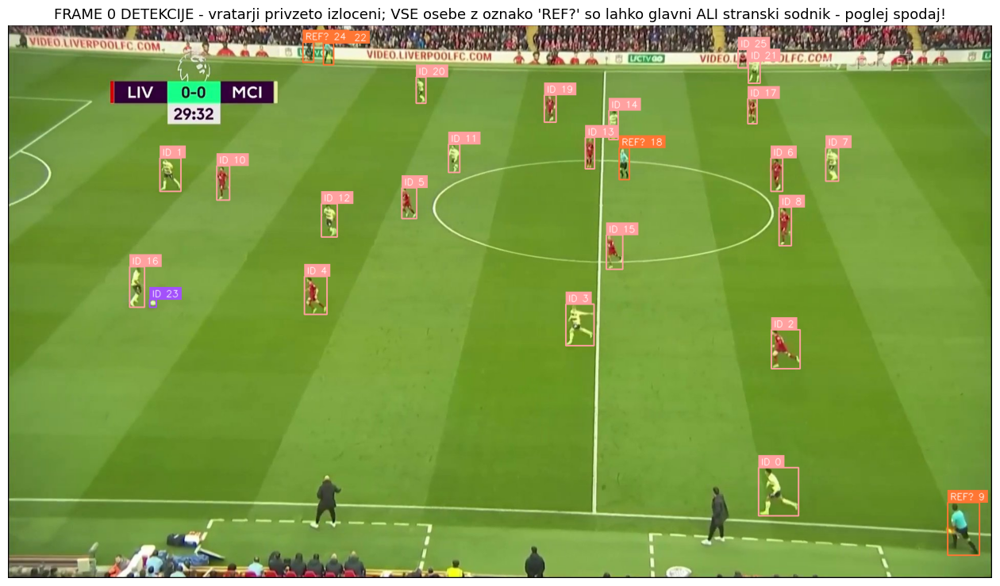

Model je kot 'sodnik' zaznal indekse [9, 18, 22, 24] - to so lahko glavni sodnik (SLEDI SE) ali stranska sodnika (NE sledita se). Razlikuj jih v spodnjem polju 'Stranska sodnika'.

Popravi seznama spodaj (privzeta izkljucitev vratarjev je ze vpisana) in klikni 'Potrdi izbiro':


Text(value='', description='Izkljuci ID-je:', layout=Layout(width='450px'), placeholder='npr. 0, 3, 5', style=…

Text(value='', description='Stranska sodnika:', layout=Layout(width='450px'), placeholder='npr. 4, 7  (natanko…

Button(button_style='success', description='Potrdi izbiro', style=ButtonStyle())

Output()

In [6]:
# ==============================================================================
# CELICA 2: INTERAKTIVNA IZBIRA — Frame 0, izkljucitve IN oznacitev stranskih sodnikov
# ==============================================================================
"""
Poleg izlocanja napacnih detekcij uporabnik tu OBVEZNO oznaci tudi, kateri
zaznani ID-ji predstavljajo STRANSKA SODNIKA (linesmen) - ta dva objekta se
NE bosta sledila skozi Celico 3 (za razliko od glavnega sodnika, ki se sledi
normalno, a je iz clusteringa v ekipe izkljucen prek is_referee_id()).

Glavni sodnik: pusti ga v seznamu sledenih objektov, NE ga vpisi med
"stranske sodnike" spodaj. Njegov ID je tu EKSPLICITNO preslikan v razpon
REF_ID_OFFSET (definiran v Celici 1), zato ga Celica 3 zanesljivo prepozna
kot sodnika (is_referee_id) in ga izkljuci iz razvrscanja v ekipe.
"""

import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
import supervision as sv
import ipywidgets as widgets
from IPython.display import display


def load_first_frame(frame_dir: str):
    frames = sorted(
        f for f in os.listdir(frame_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    )
    if not frames:
        raise FileNotFoundError(
            f"Ni okvirjev v {frame_dir}. Preveri, da je Celica 1 uspesno ekstrahirala okvirje."
        )
    frame_0 = cv2.imread(os.path.join(frame_dir, frames[0]))
    if frame_0 is None:
        raise ValueError(f"Ni bilo mogoce nalozili slike {frames[0]}")
    return frame_0, frames


def detect_frame0_objects(frame, model_id: str) -> sv.Detections:
    results = client.infer(frame, model_id=model_id)
    return sv.Detections.from_inference(results).with_nms(threshold=0.4)


def find_class_indices(detections: sv.Detections, class_mapping: dict, class_names: tuple) -> set:
    """Poisce indekse detekcij za katerikoli razred (GK, referee, ...)."""
    target_class_id = next(
        (v for k, v in class_mapping.items() if str(k).lower() in class_names),
        None,
    )
    if target_class_id is None or detections.class_id is None:
        return set()
    return {idx for idx, cid in enumerate(detections.class_id) if cid == target_class_id}


def render_annotated_frame(frame, detections: sv.Detections, gk_indices: set, ref_indices: set):
    """Oznaci Frame 0 z ID stevilkami; vratarje z GK, sodnike z REF?."""
    box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator(text_scale=0.6, text_padding=5)

    annotated = box_annotator.annotate(scene=frame.copy(), detections=detections)
    labels = []
    for idx in range(len(detections)):
        if idx in gk_indices:
            labels.append(f"GK {idx}")
        elif idx in ref_indices:
            labels.append(f"REF? {idx}")
        else:
            labels.append(f"ID {idx}")
    return label_annotator.annotate(scene=annotated, detections=detections, labels=labels)


# ── 1. Detekcija na Frame 0 ────────────────────────────────────────────────────
frame_0, all_frames = load_first_frame(TEMP_FRAME_DIR)
detections = detect_frame0_objects(frame_0, MODEL_ID)

goalkeeper_indices = find_class_indices(detections, CLASS_MAPPING, ("goalkeeper", "gk", "vratar"))
referee_indices    = find_class_indices(detections, CLASS_MAPPING, ("referee", "sodnik"))

# ── 2. Prikaz oznacenega okvirja ───────────────────────────────────────────────
annotated_frame_0 = render_annotated_frame(frame_0, detections, goalkeeper_indices, referee_indices)

plt.figure(figsize=(16, 10))
plt.imshow(cv2.cvtColor(annotated_frame_0, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title(
    "FRAME 0 DETEKCIJE - vratarji privzeto izloceni; VSE osebe z oznako 'REF?' "
    "so lahko glavni ALI stranski sodnik - poglej spodaj!",
    fontsize=13,
)
plt.show()

if goalkeeper_indices:
    print(f"Na Frame 0 zaznan(i) vratar(ji) na indeksih {sorted(goalkeeper_indices)} - "
          f"privzeto izlocen(i) iz zacetnega niza (Celica 3 jih zazna in identificira samodejno).")

if referee_indices:
    print(f"Model je kot 'sodnik' zaznal indekse {sorted(referee_indices)} - "
          f"to so lahko glavni sodnik (SLEDI SE) ali stranska sodnika (NE sledita se). "
          f"Razlikuj jih v spodnjem polju 'Stranska sodnika'.")

# ── 3. Interaktivni UI za izbiro izkljucitev + stranske sodnike ───────────────
default_exclude = ", ".join(str(i) for i in sorted(goalkeeper_indices))

exclude_w = widgets.Text(
    value=default_exclude,
    placeholder="npr. 0, 3, 5",
    description="Izkljuci ID-je:",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="450px"),
)

linesmen_w = widgets.Text(
    value="",
    placeholder="npr. 4, 7  (natanko dva ID-ja stranskih sodnikov)",
    description="Stranska sodnika:",
    style={"description_width": "initial"},
    layout=widgets.Layout(width="450px"),
)

button_w = widgets.Button(description="Potrdi izbiro", button_style="success")
output_w = widgets.Output()

selected_boxes = {}
linesmen_ids = set()


def on_confirm_clicked(_):
    global selected_boxes, linesmen_ids
    with output_w:
        output_w.clear_output()

        excluded_ids = {int(item) for item in exclude_w.value.split(",") if item.strip().isdigit()}
        linesmen_ids = {int(item) for item in linesmen_w.value.split(",") if item.strip().isdigit()}

        invalid_linesmen = linesmen_ids - referee_indices
        if invalid_linesmen:
            print(f"Opozorilo: indeksi {sorted(invalid_linesmen)} niso bili zaznani kot "
                  f"razred 'referee' na Frame 0 - preveri, ali si vpisal pravilne ID-je.")

        all_excluded = excluded_ids | linesmen_ids

        # Glavni sodnik = zaznan kot "referee", a NI med izkljucenimi stranskima sodnikoma
        main_referee_indices = referee_indices - linesmen_ids

        # KLJUCNI POPRAVEK: glavnemu sodniku preslikamo Frame-0 indeks v ID iz
        # razpona REF_ID_OFFSET, definiranega v Celici 1. Brez te preslikave
        # bi obj_id ostal enak surovemu indeksu (npr. 6), kar je << REF_ID_OFFSET
        # (5000) - Celica 3 bi ga zato obravnavala kot navadnega igralca in ga
        # razvrstila v eno od dveh ekip.
        selected_boxes = {}
        for idx, xyxy in enumerate(detections.xyxy):
            if idx in all_excluded:
                continue
            if idx in main_referee_indices:
                new_id = REF_ID_OFFSET + idx
                selected_boxes[new_id] = xyxy
            else:
                selected_boxes[idx] = xyxy

        excluded_gk = excluded_ids & goalkeeper_indices

        print(f"Izbira shranjena! Sledim {len(selected_boxes)} objektom z ID-ji: {sorted(selected_boxes.keys())}")
        if linesmen_ids:
            print(f"Stranska sodnika (ID-ji {sorted(linesmen_ids)}) NE bosta sledena.")
        if main_referee_indices:
            remapped = {i: REF_ID_OFFSET + i for i in main_referee_indices}
            print(f"Glavni sodnik preslikan v razpon sodnikov: {remapped} "
                  f"(Celica 3 ga bo prepoznala prek is_referee_id in izkljucila iz razvrscanja v ekipe).")
        if excluded_gk:
            print(f"{len(excluded_gk)} vratar(jev) bo v sledenje dodan(ih) samodejno "
                  f"prek re-identifikacije v Celici 3.")
        print("Sedaj lahko pozenes Celico 3.")


button_w.on_click(on_confirm_clicked)

print("\nPopravi seznama spodaj (privzeta izkljucitev vratarjev je ze vpisana) "
      "in klikni 'Potrdi izbiro':")
display(exclude_w, linesmen_w, button_w, output_w)

Cell 3: Prostorska dodelitev vratarjev in Končni izris videa (Render)

Sledenje SAM2 z cluster-wide detection trust + duplicate/missing failsafe (razred vratarja: 1)...
  Kos 1/5 (okvirji 0-149)...


frame loading (JPEG): 100%|██████████| 150/150 [00:08<00:00, 17.57it/s]
/content/segment-anything-2/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/content/segment-anything-2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 150/150 [17:10<00:00,  6.87s/it]


  Kos 2/5 (okvirji 150-299)...


propagate in video: 100%|██████████| 150/150 [17:04<00:00,  6.83s/it]


  Kos 3/5 (okvirji 300-449)...


propagate in video:   1%|          | 1/150 [00:01<04:12,  1.69s/it]

  Nov vratar (ID 20000) zaznan na okvirju 300.


propagate in video:   7%|▋         | 11/150 [00:58<15:30,  6.70s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 310 (podobnost 0.97).


propagate in video:  14%|█▍        | 21/150 [02:07<14:56,  6.95s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 320 (podobnost 0.97).


propagate in video:  21%|██        | 31/150 [03:15<13:48,  6.96s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 330 (podobnost 0.96).


propagate in video:  27%|██▋       | 41/150 [04:28<13:42,  7.55s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 340 (podobnost 0.96).


propagate in video:  29%|██▉       | 44/150 [04:54<14:43,  8.33s/it]

  🚨 OPOZORILO: pid 6 in pid 7 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  34%|███▍      | 51/150 [05:51<13:50,  8.39s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 350 (podobnost 0.97).


propagate in video:  41%|████      | 61/150 [07:08<11:28,  7.74s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 360 (podobnost 0.97).


propagate in video:  45%|████▍     | 67/150 [07:52<10:21,  7.48s/it]

  🚨 OPOZORILO: pid 6 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  47%|████▋     | 71/150 [08:25<10:27,  7.94s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 370 (podobnost 0.97).


propagate in video:  53%|█████▎    | 80/150 [09:34<08:47,  7.53s/it]

  🚨 OPOZORILO: pid 6 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  57%|█████▋    | 85/150 [10:15<08:46,  8.10s/it]

  🚨 OPOZORILO: pid 6 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  58%|█████▊    | 87/150 [10:31<08:14,  7.85s/it]

  🚨 OPOZORILO: pid 6 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  63%|██████▎   | 95/150 [11:40<08:06,  8.85s/it]

  🚨 OPOZORILO: pid 17 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  64%|██████▍   | 96/150 [11:49<07:52,  8.75s/it]

  🚨 OPOZORILO: pid 17 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  65%|██████▍   | 97/150 [11:57<07:43,  8.74s/it]

  🚨 OPOZORILO: pid 17 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  65%|██████▌   | 98/150 [12:07<07:46,  8.96s/it]

  🚨 OPOZORILO: pid 17 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  71%|███████   | 106/150 [13:08<05:44,  7.82s/it]

  🚨 OPOZORILO: pid 2 in pid 7 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  73%|███████▎  | 109/150 [13:33<05:35,  8.17s/it]

  🚨 OPOZORILO: pid 2 in pid 7 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.
  🚨 OPOZORILO: pid 17 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  74%|███████▍  | 111/150 [13:50<05:25,  8.35s/it]

  🚨 OPOZORILO: pid 17 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  75%|███████▌  | 113/150 [14:07<05:07,  8.30s/it]

  🚨 OPOZORILO: pid 6 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  76%|███████▌  | 114/150 [14:15<05:04,  8.45s/it]

  🚨 OPOZORILO: pid 6 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  77%|███████▋  | 115/150 [14:24<04:54,  8.43s/it]

  🚨 OPOZORILO: pid 6 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  77%|███████▋  | 116/150 [14:32<04:44,  8.37s/it]

  🚨 OPOZORILO: pid 6 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  79%|███████▉  | 119/150 [14:56<04:13,  8.18s/it]

  🚨 OPOZORILO: pid 2 in pid 7 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  85%|████████▌ | 128/150 [16:09<02:55,  7.97s/it]

  🚨 OPOZORILO: pid 13 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  87%|████████▋ | 130/150 [16:25<02:40,  8.03s/it]

  🚨 OPOZORILO: pid 13 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  87%|████████▋ | 131/150 [16:33<02:30,  7.94s/it]

  🚨 OPOZORILO: pid 2 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  91%|█████████ | 136/150 [17:12<01:49,  7.82s/it]

  🚨 OPOZORILO: pid 14 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  96%|█████████▌| 144/150 [18:18<00:49,  8.19s/it]

  🚨 OPOZORILO: pid 2 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.
  🚨 OPOZORILO: pid 7 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  97%|█████████▋| 146/150 [18:35<00:32,  8.25s/it]

  🚨 OPOZORILO: pid 6 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  99%|█████████▉| 149/150 [18:59<00:08,  8.13s/it]

  🚨 OPOZORILO: pid 14 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video: 100%|██████████| 150/150 [19:07<00:00,  7.65s/it]

  🚨 OPOZORILO: pid 14 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


  Kos 4/5 (okvirji 450-599)...


propagate in video:   1%|          | 1/150 [00:01<03:39,  1.47s/it]

  🚨 OPOZORILO: pid 2 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.
  🚨 OPOZORILO: pid 6 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.
  🚨 OPOZORILO: pid 7 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:   1%|▏         | 2/150 [00:05<07:10,  2.91s/it]

  🚨 OPOZORILO: pid 7 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:   3%|▎         | 5/150 [00:20<11:34,  4.79s/it]

  🚨 OPOZORILO: pid 7 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:   5%|▍         | 7/150 [00:36<15:13,  6.39s/it]

  🚨 OPOZORILO: pid 2 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:   6%|▌         | 9/150 [00:52<17:28,  7.44s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:   7%|▋         | 11/150 [01:08<17:44,  7.66s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 460 (podobnost 0.94).


propagate in video:   8%|▊         | 12/150 [01:16<18:09,  7.90s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.
  🚨 OPOZORILO: pid 7 in pid 17 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:   9%|▉         | 14/150 [01:33<18:13,  8.04s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  11%|█         | 16/150 [01:49<18:14,  8.16s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  11%|█▏        | 17/150 [01:57<18:15,  8.23s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  12%|█▏        | 18/150 [02:06<18:25,  8.37s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  13%|█▎        | 19/150 [02:14<18:11,  8.33s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  13%|█▎        | 20/150 [02:23<18:08,  8.37s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  14%|█▍        | 21/150 [02:32<18:19,  8.53s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 470 (podobnost 0.95).
  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  15%|█▍        | 22/150 [02:40<18:04,  8.48s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  15%|█▌        | 23/150 [02:48<17:49,  8.42s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  16%|█▌        | 24/150 [02:57<17:36,  8.39s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  17%|█▋        | 25/150 [03:05<17:24,  8.36s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  17%|█▋        | 26/150 [03:13<17:13,  8.34s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  19%|█▊        | 28/150 [03:29<16:37,  8.17s/it]

  🚨 OPOZORILO: pid 2 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.
  🚨 OPOZORILO: pid 7 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  21%|██        | 31/150 [03:54<16:15,  8.20s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 480 (podobnost 0.96).
  🚨 OPOZORILO: pid 7 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  22%|██▏       | 33/150 [04:10<16:06,  8.26s/it]

  🚨 OPOZORILO: pid 7 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  23%|██▎       | 35/150 [04:26<15:42,  8.19s/it]

  🚨 OPOZORILO: pid 2 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  25%|██▍       | 37/150 [04:43<15:18,  8.13s/it]

  🚨 OPOZORILO: pid 7 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  25%|██▌       | 38/150 [04:51<15:15,  8.17s/it]

  🚨 OPOZORILO: pid 7 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  27%|██▋       | 41/150 [05:16<15:08,  8.33s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 490 (podobnost 0.97).


propagate in video:  34%|███▍      | 51/150 [06:36<13:17,  8.05s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 500 (podobnost 0.96).
  🚨 OPOZORILO: pid 17 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  35%|███▍      | 52/150 [06:44<13:21,  8.18s/it]

  🚨 OPOZORILO: pid 17 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  35%|███▌      | 53/150 [06:52<13:13,  8.18s/it]

  🚨 OPOZORILO: pid 17 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  41%|████      | 61/150 [08:02<13:00,  8.77s/it]

  🚨 OPOZORILO: pid 8 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  42%|████▏     | 63/150 [08:19<12:31,  8.64s/it]

  🚨 OPOZORILO: pid 8 in pid 14 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  51%|█████     | 76/150 [10:13<11:08,  9.04s/it]

  🚨 OPOZORILO: pid 15 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  51%|█████▏    | 77/150 [10:22<11:02,  9.08s/it]

  🚨 OPOZORILO: pid 15 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  52%|█████▏    | 78/150 [10:31<10:47,  8.99s/it]

  🚨 OPOZORILO: pid 15 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  55%|█████▌    | 83/150 [11:16<10:11,  9.12s/it]

  🚨 OPOZORILO: pid 15 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  56%|█████▌    | 84/150 [11:25<09:59,  9.09s/it]

  🚨 OPOZORILO: pid 15 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  61%|██████    | 91/150 [12:28<08:56,  9.10s/it]

  Vratar ID 20000 se je ponovno pojavil na okvirju 540 (podobnost 0.89).


propagate in video:  61%|██████▏   | 92/150 [12:38<08:49,  9.13s/it]

  🚨 OPOZORILO: pid 17 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  65%|██████▍   | 97/150 [13:23<08:04,  9.14s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  66%|██████▌   | 99/150 [13:42<07:49,  9.21s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  67%|██████▋   | 100/150 [13:51<07:46,  9.34s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  67%|██████▋   | 101/150 [14:01<07:48,  9.56s/it]

  🚨 OPOZORILO: pid 17 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  68%|██████▊   | 102/150 [14:11<07:40,  9.60s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.
  🚨 OPOZORILO: pid 17 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  69%|██████▊   | 103/150 [14:20<07:23,  9.44s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  69%|██████▉   | 104/150 [14:30<07:17,  9.51s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  70%|███████   | 105/150 [14:39<07:10,  9.57s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.
  🚨 OPOZORILO: pid 17 in pid 20000 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  71%|███████   | 106/150 [14:49<06:59,  9.53s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  73%|███████▎  | 109/150 [15:13<05:50,  8.55s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  73%|███████▎  | 110/150 [15:22<05:39,  8.49s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  74%|███████▍  | 111/150 [15:30<05:36,  8.62s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  76%|███████▌  | 114/150 [15:56<05:04,  8.45s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  77%|███████▋  | 115/150 [16:04<04:54,  8.41s/it]

  🚨 OPOZORILO: pid 7 in pid 8 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  78%|███████▊  | 117/150 [16:19<04:25,  8.05s/it]

  🚨 OPOZORILO: pid 6 in pid 21 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  85%|████████▍ | 127/150 [17:42<03:09,  8.24s/it]

  🚨 OPOZORILO: pid 6 in pid 11 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video:  97%|█████████▋| 145/150 [20:13<00:41,  8.24s/it]

  🚨 OPOZORILO: pid 6 in pid 11 imata skoraj identicna boxa (IoU > 0.85) izven pricakovanega cluster resolverja - preveri rocno.


propagate in video: 100%|██████████| 150/150 [20:56<00:00,  8.37s/it]


  Kos 5/5 (okvirji 600-601)...


propagate in video: 100%|██████████| 2/2 [00:06<00:00,  3.02s/it]


Sledenje koncano. Video shranjen: /content/output_mod.mp4
📊 POROČILO O ZMOGLJIVOSTI IN HITROSTI IZVAJANJA (PREDLAGANI SISTEM (CLUSTER-WIDE DETECTION TRUST + DUPLICATE/MISSING FAILSAFE))
🖥️ Uporabljena strojna oprema:
   - GPU: Tesla T4
   - CPU: 2 jeder
🎥 Dolžina testnega videa:
   - Skupaj okvirjev: 602
   - Trajanje videa: 20.04 s (pri 30.0 FPS)
⏱️ Čas obdelave:
   - Skupni čas izvajanja: 4536.54 s (75.61 min)
⚡ Povprečna hitrost:
   - Povprečni FPS: 0.13 okvirjev/s
   - Čas na okvir: 7535.78 ms
Razvrscanje po dresih (SigLIP + UMAP + KMeans) in prostorska dodelitev GK...


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Povprecni polozaj TEAM_0: [896.40123865 441.57735651]
Povprecni polozaj TEAM_1: [1133.92482784  410.82834921]
  Vratar ID 20000 pri [1566.7  314.7] dodeljen ekipi TEAM_1 (razdalja T0: 682.2px, T1: 443.3px)
Koncne razvrstitve v ekipe:
   ID 0: TEAM_0
   ID 1: TEAM_0
   ID 2: TEAM_1
   ID 3: TEAM_0
   ID 4: TEAM_1
   ID 5: TEAM_1
   ID 6: TEAM_1
   ID 7: TEAM_0
   ID 8: TEAM_1
   ID 10: TEAM_1
   ID 11: TEAM_0
   ID 12: TEAM_0
   ID 13: TEAM_1
   ID 14: TEAM_0
   ID 15: TEAM_1
   ID 16: TEAM_0
   ID 17: TEAM_1
   ID 19: TEAM_1
   ID 20: TEAM_0
   ID 21: TEAM_1
   ID 5018: REFEREE
   ID 20000: TEAM_1
Prikaz kronoloske mreze izrezkov dresov (50x2)...


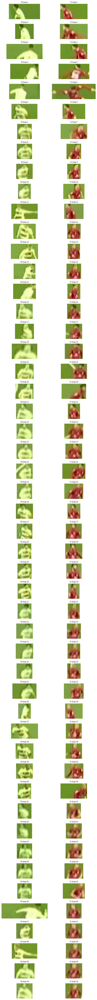

Shranjujem .pkl datoteke...
Vse .pkl datoteke uspesno shranjene.
   /content/propagated_db.pkl (602 okvirjev)
   /content/ball_positions.pkl (520 okvirjev zoge)
   /content/locked_track_assignments.pkl (22 entitet)


In [7]:
# ==============================================================================
# CELICA 3: SLEDENJE SAM2 + RE-PROMPTING + GK RE-IDENTIFIKACIJA + RAZVRSCANJE V EKIPI
# ==============================================================================
"""
Ta celica:
  1. Sledi igralcem, vratarjem in glavnemu sodniku skozi celoten video z modelom
     SAM2, ki ga nadgrajuje z RF-DETR ponovno detekcijo, Madzarsko metodo za
     povezovanje identitet ob prekrivanjih ter re-promptingom ob locitvi.
  2. Vratarje obravnava loceno: ker v takticnem kadru pogosto niso vidni od
     zacetka, jih sistem zazna in identificira samodejno - s prostorskim
     ujemanjem, ce jih ze aktivno sledi, sicer z re-identifikacijo na podlagi
     SigLIP opisnikov (glej GoalkeeperReIDBank).
  3. Igralce razvrsti v ekipi z UMAP + KMeans na podlagi SigLIP opisnikov
     dresov, vratarje pa v ekipo dodeli glede na prostorsko blizino. Glavni
     sodnik (prepoznan po ID razponu REF_ID_OFFSET, dodeljenem ze v Celici 2)
     je iz razvrscanja v ekipo v celoti izkljucen in dobi fiksno oznako
     "REFEREE". Stranska sodnika v tej celici sploh ne nastopata, ker sta bila
     izkljucena ze v Celici 2 in nista del `selected_boxes`.
  4. Meri zmogljivost in hitrost izvajanja celotnega sledenja (glej
     `print_performance_report`) v enakem formatu kot pri primerjalnih
     metodah (vanilla SAM2, DeepSORT, ByteTrack).
  5. Rezultate izvozi v .pkl datoteke za nadaljnjo prostorsko analizo.
"""

import time
from scipy.optimize import linear_sum_assignment
import matplotlib.pyplot as plt


# ==============================================================================
# KONFIGURACIJA
# ==============================================================================
# Opomba: REF_ID_OFFSET, GK_ID_OFFSET ter pomozne funkcije is_player_id(),
# is_referee_id() in is_goalkeeper_id() so definirane v Celici 1 in se tu
# ponovno uporabijo - namerno niso podvojene, da ne pride do neskladja.

MIN_MASK_PIXELS = 20            # Najmanjse stevilo pikslov, da SAM2 maska velja za veljavno
OVERLAP_IOU_THRESHOLD = 0.20    # Prag IoU za zaznavo prekrivanja dveh igralcev
REDETECTION_INTERVAL = 10       # Interval (v okvirjih) za periodicno RF-DETR detekcijo
OVERLAP_MATCH_MAX_DIST = 80.0   # Najvecja razdalja pri povezovanju z Madzarsko metodo
VELOCITY_SMOOTHING = 0.3        # Utez eksponentnega glajenja vektorja hitrosti

GK_SPATIAL_MATCH_IOU = 0.15          # Prag IoU za prepoznavo ze aktivno sledenega vratarja
GK_REID_SIMILARITY_THRESHOLD = 0.75  # Prag kosinusne podobnosti za re-identifikacijo
GK_MAX_MISSING_FRAMES = 45           # Po tem stevilu okvirjev brez zaznave vratarja umaknemo

SNAPSHOT_GRID_SIZE = 50          # Stevilo izrezkov na ekipo v kronoloski mrezi (Section C)
SNAPSHOT_CROPS_PER_PLAYER = 5


# ==============================================================================
# POMOZNE FUNKCIJE - MERJENJE ZMOGLJIVOSTI  # NOVO
# ==============================================================================

def get_gpu_name() -> str:
    """Vrne ime uporabljenega GPU-ja (ali oznako, da GPU ni na voljo)."""
    if torch.cuda.is_available():
        return torch.cuda.get_device_name(0)
    return "CPU (brez GPU-ja)"


def get_cpu_core_count() -> int:
    """Vrne število logičnih jeder CPU-ja."""
    return os.cpu_count() or 1


def print_performance_report(
    elapsed_seconds: float,
    total_frames: int,
    fps: float,
    gpu_name: str,
    cpu_cores: int,
    method_label: str = "",
) -> None:
    """Izpiše poročilo o zmogljivosti in hitrosti izvajanja v enakem formatu,
    kot je bil uporabljen za primerjalne metode (vanilla SAM2, DeepSORT, ByteTrack)."""
    video_duration_sec = total_frames / fps
    avg_fps = total_frames / elapsed_seconds
    time_per_frame_ms = (elapsed_seconds / total_frames) * 1000

    title = "POROČILO O ZMOGLJIVOSTI IN HITROSTI IZVAJANJA"
    if method_label:
        title += f" ({method_label})"

    print("=" * 60)
    print(f"📊 {title}")
    print("=" * 60)
    print("🖥️ Uporabljena strojna oprema:")
    print(f"   - GPU: {gpu_name}")
    print(f"   - CPU: {cpu_cores} jeder")
    print("🎥 Dolžina testnega videa:")
    print(f"   - Skupaj okvirjev: {total_frames}")
    print(f"   - Trajanje videa: {video_duration_sec:.2f} s (pri {fps:.1f} FPS)")
    print("⏱️ Čas obdelave:")
    print(f"   - Skupni čas izvajanja: {elapsed_seconds:.2f} s ({elapsed_seconds / 60:.2f} min)")
    print("⚡ Povprečna hitrost:")
    print(f"   - Povprečni FPS: {avg_fps:.2f} okvirjev/s")
    print(f"   - Čas na okvir: {time_per_frame_ms:.2f} ms")
    print("=" * 60)


# ==============================================================================
# POMOZNE FUNKCIJE - IZREZKI IN OPISNIKI
# ==============================================================================

def get_upper_body_crop_from_mask(frame: np.ndarray, mask: np.ndarray, upper_fraction: float = 0.4):
    """Izreze zgornji del telesa igralca iz SAM2 segmentacijske maske (za SigLIP opisnik dresa)."""
    y_idx, x_idx = np.where(mask)
    if len(x_idx) == 0:
        return None

    ymin, ymax = int(y_idx.min()), int(y_idx.max())
    xmin, xmax = int(x_idx.min()), int(x_idx.max())
    y_cut = int(ymin + (ymax - ymin) * upper_fraction)

    crop = frame[ymin:y_cut, xmin:xmax]
    if crop.shape[0] < 5 or crop.shape[1] < 5:
        crop = frame[ymin:ymax, xmin:xmax]
    return crop if crop.size > 0 else None


def get_upper_body_crop_from_box(frame: np.ndarray, box: list[float], upper_fraction: float = 0.4):
    """Enako kot zgoraj, a izhaja neposredno iz mejnega pravokotnika - uporabno za sveze
    RF-DETR detekcije (npr. vratarja), za katere se nimamo SAM2 maske."""
    x1, y1, x2, y2 = map(int, box)
    y_cut = int(y1 + (y2 - y1) * upper_fraction)

    crop = frame[y1:y_cut, x1:x2]
    if crop.shape[0] < 5 or crop.shape[1] < 5:
        crop = frame[y1:y2, x1:x2]
    return crop if crop.size > 0 else None


def embed_crops_batch(crops_rgb: list[np.ndarray]) -> np.ndarray:
    """Izracuna L2-normalizirane SigLIP opisnike za paket izrezkov (RGB slike)."""
    inputs = siglip_processor(images=crops_rgb, return_tensors="pt", padding=True).to(DEVICE)
    with torch.no_grad():
        output = siglip_model.get_image_features(**inputs)
        if getattr(output, "pooler_output", None) is not None:
            feats = output.pooler_output
        elif hasattr(output, "last_hidden_state"):
            feats = output.last_hidden_state[:, 0, :]
        else:
            feats = output[0]
        feats = feats / feats.norm(p=2, dim=-1, keepdim=True)
    return feats.cpu().numpy()


def calculate_box_iou(box_a: list[float], box_b: list[float]) -> float:
    """Izracuna prekrivanje (Intersection over Union) med dvema mejnima pravokotnikoma."""
    xa, ya = max(box_a[0], box_b[0]), max(box_a[1], box_b[1])
    xb, yb = min(box_a[2], box_b[2]), min(box_a[3], box_b[3])

    inter_area = max(0, xb - xa) * max(0, yb - ya)
    if inter_area <= 0:
        return 0.0

    area_a = (box_a[2] - box_a[0]) * (box_a[3] - box_a[1])
    area_b = (box_b[2] - box_b[0]) * (box_b[3] - box_b[1])
    return inter_area / float(area_a + area_b - inter_area + 1e-6)


def box_center(box) -> tuple[float, float]:
    return float((box[0] + box[2]) / 2.0), float((box[1] + box[3]) / 2.0)


# ==============================================================================
# RE-IDENTIFIKACIJA VRATARJA
# ==============================================================================

class GoalkeeperReIDBank:
    """
    Hrani SigLIP opisnike za vsakega doslej videnega vratarja.

    Ko RF-DETR zazna vratarja, ki ga trenutno prostorsko ne sledimo (ker se je
    pravkar pojavil ali se je vrnil po izginotju), banka primerja njegov nov
    opisnik s povprecnim opisnikom vsakega znanega vratarja (kosinusna
    podobnost). Ce je najboljse ujemanje nad pragom, mu dodeli obstojeco
    identiteto, sicer registrira novo.
    """

    def __init__(self, similarity_threshold: float = GK_REID_SIMILARITY_THRESHOLD, max_embeddings: int = 12):
        self.embeddings: dict[int, list[np.ndarray]] = defaultdict(list)
        self.similarity_threshold = similarity_threshold
        self.max_embeddings = max_embeddings

    def _mean_embedding(self, gk_id: int) -> np.ndarray:
        return np.mean(self.embeddings[gk_id], axis=0)

    def _register(self, gk_id: int, embedding: np.ndarray) -> None:
        self.embeddings[gk_id].append(embedding)
        if len(self.embeddings[gk_id]) > self.max_embeddings:
            self.embeddings[gk_id].pop(0)

    def match_or_register(self, embedding: np.ndarray, next_id_fn) -> tuple[int, float, bool]:
        """Vrne (gk_id, podobnost, is_new). `next_id_fn` vrne naslednji prosti ID."""
        best_id, best_sim = None, -1.0
        for gk_id in self.embeddings:
            sim = float(np.dot(embedding, self._mean_embedding(gk_id)))
            if sim > best_sim:
                best_id, best_sim = gk_id, sim

        if best_id is not None and best_sim >= self.similarity_threshold:
            self._register(best_id, embedding)
            return best_id, best_sim, False

        new_id = next_id_fn()
        self._register(new_id, embedding)
        return new_id, 1.0, True


class GoalkeeperIdAllocator:
    """Dodeljuje zaporedne, enolicne identifikatorje vratarjem (ID >= GK_ID_OFFSET)."""

    def __init__(self, existing_ids: list[int]):
        self._next_id = max(existing_ids) + 1 if existing_ids else GK_ID_OFFSET

    def next_id(self) -> int:
        allocated = self._next_id
        self._next_id += 1
        return allocated


def resolve_class_id(class_mapping: dict, names: tuple) -> int | None:
    """Poisce ID razreda (npr. 'goalkeeper', 'referee') v mapiranju razredov modela."""
    return next(
        (v for k, v in class_mapping.items() if str(k).lower() in names),
        None,
    )


def handle_goalkeeper_detections(
    gk_boxes: np.ndarray,
    frame: np.ndarray,
    player_states: dict,
    p_ids: list,
    predictor,
    inf_state,
    local_idx: int,
    global_idx: int,
    gk_reid_bank: GoalkeeperReIDBank,
    gk_id_allocator: GoalkeeperIdAllocator,
) -> None:
    """
    Za vsako zaznano detekcijo vratarja poskusi:
      1. prostorsko ujemanje z ze aktivno sledenim vratarjem (osvezitev spomina SAM2),
      2. sicer re-identifikacijo prek SigLIP opisnika (isti/nov vratar).
    """
    for gk_box in gk_boxes:
        active_gk_ids = [pid for pid in player_states if is_goalkeeper_id(pid)]
        best_match_pid, best_iou = None, 0.0
        for existing_pid in active_gk_ids:
            iou = calculate_box_iou(gk_box, player_states[existing_pid]["box"])
            if iou > best_iou:
                best_iou, best_match_pid = iou, existing_pid

        if best_match_pid is not None and best_iou > GK_SPATIAL_MATCH_IOU:
            st = player_states[best_match_pid]
            st["box"] = list(gk_box)
            st["cx"], st["cy"] = box_center(gk_box)
            st["frames_since_seen"] = 0
            try:
                predictor.add_new_points_or_box(
                    inference_state=inf_state, frame_idx=local_idx, obj_id=best_match_pid,
                    box=np.array(gk_box, dtype=np.float32),
                )
            except Exception:
                pass
            continue

        crop = get_upper_body_crop_from_box(frame, gk_box)
        if crop is None:
            continue

        crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
        gk_embedding = embed_crops_batch([crop_rgb])[0]
        gk_id, similarity, is_new = gk_reid_bank.match_or_register(gk_embedding, gk_id_allocator.next_id)

        if is_new:
            print(f"  Nov vratar (ID {gk_id}) zaznan na okvirju {global_idx}.")
        else:
            print(f"  Vratar ID {gk_id} se je ponovno pojavil na okvirju {global_idx} "
                  f"(podobnost {similarity:.2f}).")

        predictor.add_new_points_or_box(
            inference_state=inf_state, frame_idx=local_idx, obj_id=gk_id,
            box=np.array(gk_box, dtype=np.float32),
        )
        cx, cy = box_center(gk_box)
        player_states[gk_id] = {
            "cx": cx, "cy": cy,
            "w": float(gk_box[2] - gk_box[0]), "h": float(gk_box[3] - gk_box[1]),
            "vx": 0.0, "vy": 0.0,
            "box": list(gk_box),
            "frames_since_seen": 0,
        }
        if gk_id not in p_ids:
            p_ids.append(gk_id)


# ==============================================================================
# SECTION A: SAM2 SLEDENJE Z RE-PROMPTINGOM IN GK RE-IDENTIFIKACIJO
# ==============================================================================

def collect_sam_masks(obj_ids, mask_logits) -> dict[int, dict]:
    """Iz izhoda SAM2 propagacije zgradi slovar {obj_id: {"box", "mask"}}."""
    sam_masks = {}
    if len(obj_ids) == 0:
        return sam_masks

    if isinstance(mask_logits, torch.Tensor):
        stacked_logits = mask_logits.squeeze(1)
    else:
        stacked_logits = torch.cat(list(mask_logits), dim=0).squeeze(1)

    max_logits, winning_indices = torch.max(stacked_logits, dim=0)
    positive_mask = max_logits > 0.0

    for o_idx, o_id in enumerate(obj_ids):
        mask = (winning_indices == o_idx) & positive_mask
        mask_cpu = mask.cpu().numpy()
        if mask_cpu.sum() >= MIN_MASK_PIXELS:
            y_idx, x_idx = np.where(mask_cpu)
            box = [float(x_idx.min()), float(y_idx.min()), float(x_idx.max()), float(y_idx.max())]
            sam_masks[o_id] = {"box": box, "mask": mask_cpu}

    return sam_masks


def find_overlapping_pairs(p_ids: list, player_states: dict, sam_masks: dict) -> set:
    """Poisce pare igralcev, katerih mejni pravokotniki se prekrivajo nad pragom IoU."""
    overlapping = set()
    for i in range(len(p_ids)):
        for j in range(i + 1, len(p_ids)):
            pid1, pid2 = p_ids[i], p_ids[j]
            box1 = sam_masks[pid1]["box"] if pid1 in sam_masks else player_states[pid1]["box"]
            box2 = sam_masks[pid2]["box"] if pid2 in sam_masks else player_states[pid2]["box"]
            if calculate_box_iou(box1, box2) > OVERLAP_IOU_THRESHOLD:
                overlapping.update((pid1, pid2))
    return overlapping


def reprompt_separated_players(just_separated: set, player_states: dict, predictor, inf_state, local_idx: int) -> None:
    """Ob locitvi dveh prekrivajocih se igralcev ponovno inicializira SAM2 z osvezenim boxom."""
    for pid in just_separated:
        try:
            predictor.add_new_points_or_box(
                inference_state=inf_state, frame_idx=local_idx, obj_id=pid,
                box=np.array(player_states[pid]["box"], dtype=np.float32),
            )
        except Exception:
            pass


def match_overlapping_players_to_detections(
    overlapping_pids: set, player_states: dict, dets: sv.Detections, class_mapping: dict
) -> dict[int, list]:
    """Poveze prekrivajoce se igralce z novimi RF-DETR detekcijami z Madzarsko metodo,
    na podlagi razdalje med napovedanim in zaznanim polozajem."""
    if not overlapping_pids:
        return {}

    valid_class_ids = [v for k, v in class_mapping.items() if str(k).lower() != "ball"]
    person_dets = dets[np.isin(dets.class_id, valid_class_ids)]
    if len(person_dets) == 0:
        return {}

    overlap_list = list(overlapping_pids)
    det_boxes = person_dets.xyxy
    cost_matrix = np.zeros((len(overlap_list), len(det_boxes)))

    for i, pid in enumerate(overlap_list):
        st = player_states[pid]
        pred_cx, pred_cy = st["cx"] + st["vx"], st["cy"] + st["vy"]
        for j, dbox in enumerate(det_boxes):
            dcx, dcy = box_center(dbox)
            cost_matrix[i, j] = np.hypot(pred_cx - dcx, pred_cy - dcy)

    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    return {
        overlap_list[r]: det_boxes[c].tolist()
        for r, c in zip(row_ind, col_ind)
        if cost_matrix[r, c] < OVERLAP_MATCH_MAX_DIST
    }


def update_player_state(pid: int, player_states: dict, sam_masks: dict, det_assignments: dict, overlapping_pids: set) -> None:
    """Posodobi polozaj, glajeno hitrost in status zaznave posameznega igralca za trenutni okvir."""
    st = player_states[pid]
    seen_via_detection = pid in overlapping_pids and pid in det_assignments
    seen_via_mask = pid in sam_masks

    if seen_via_detection:
        new_box = det_assignments[pid]
    elif seen_via_mask:
        new_box = sam_masks[pid]["box"]
    else:
        new_box = None

    if new_box is not None:
        ncx, ncy = box_center(new_box)
        st["vx"] = VELOCITY_SMOOTHING * (ncx - st["cx"]) + (1 - VELOCITY_SMOOTHING) * st["vx"]
        st["vy"] = VELOCITY_SMOOTHING * (ncy - st["cy"]) + (1 - VELOCITY_SMOOTHING) * st["vy"]
        st["cx"], st["cy"] = ncx, ncy
        st["box"] = new_box
        st["frames_since_seen"] = 0
    else:
        st["cx"] += st["vx"]
        st["cy"] += st["vy"]
        st["box"] = [st["cx"] - st["w"] / 2, st["cy"] - st["h"] / 2, st["cx"] + st["w"] / 2, st["cy"] + st["h"] / 2]
        st["frames_since_seen"] = st.get("frames_since_seen", 0) + 1


def collect_upper_body_crop(pid: int, frame, sam_masks: dict, global_idx: int, player_embeddings: dict) -> tuple | None:
    """Za igralce v polju (ne vratarje, ne sodnika) periodicno vzorci izrezke dresa
    za SigLIP opisnike.

    Sodnika (`is_referee_id(pid)`) namerno izpustimo ze tu - zanj ne potrebujemo
    opisnika, saj se v razvrscanje v ekipo sploh ne vkljucuje (glej
    `cluster_outfield_players_into_teams`). S tem si prihranimo nepotrebno
    racunanje SigLIP vektorjev za entiteto, ki tako ali tako ne bo razvrscena.
    """
    is_outfield = is_player_id(pid)
    is_time_to_sample = global_idx % EMBED_EVERY == 0
    has_capacity = len(player_embeddings[pid]) < MAX_CROPS

    if not (is_outfield and pid in sam_masks and is_time_to_sample and has_capacity):
        return None

    crop = get_upper_body_crop_from_mask(frame, sam_masks[pid]["mask"])
    if crop is None or crop.shape[0] < 5 or crop.shape[1] < 5:
        return None

    return pid, cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)


def build_frame_detections(p_ids: list, player_states: dict, sam_masks: dict, overlapping_pids: set) -> sv.Detections | None:
    """Zgradi sv.Detections za izris trenutnega okvirja (maska ali sinteticni pravokotnik)."""
    if not p_ids:
        return None

    xyxy_list, mask_list, id_list = [], [], []
    for pid in p_ids:
        box = player_states[pid]["box"]

        if pid in sam_masks and pid not in overlapping_pids:
            mask = sam_masks[pid]["mask"]
        else:
            mask = np.zeros((video_info.height, video_info.width), dtype=bool)
            x1, y1, x2, y2 = map(int, [
                max(0, box[0]), max(0, box[1]),
                min(video_info.width, box[2]), min(video_info.height, box[3]),
            ])
            mask[y1:y2, x1:x2] = True

        xyxy_list.append(box)
        mask_list.append(mask)
        id_list.append(pid)

    return sv.Detections(
        xyxy=np.array(xyxy_list, dtype=np.float32),
        mask=np.array(mask_list, dtype=bool),
        tracker_id=np.array(id_list, dtype=np.int32),
    )


def run_sam2_tracking_with_reprompting(
    all_frames: list, selected_boxes: dict, client, model_id: str, class_mapping: dict,
):
    """
    Glavna zanka sledenja: za vsak kos (chunk) okvirjev inicializira SAM2, propagira
    maske, upravlja prekrivanja (Madzarska metoda + re-prompting) in vratarje
    (prostorsko ujemanje + re-identifikacija), ter zbira SigLIP opisnike igralcev.

    Glavni sodnik je v `selected_boxes` ze prisoten z ID-jem v razponu
    REF_ID_OFFSET (dodeljenim v Celici 2), zato se skozi to funkcijo sledi
    povsem enako kot vsak drug objekt - le v `assign_teams` je kasneje
    izkljucen iz clusteringa. Stranska sodnika v `selected_boxes` sploh nista
    prisotna, zato se v tej funkciji ne pojavita.

    Vrne (propagated_db, player_embeddings, player_representative_crops).
    """
    propagated_db: dict[int, dict] = {}
    total_frames = len(all_frames)
    chunks = list(range(0, total_frames, CHUNK_SIZE))

    mask_annotator = sv.MaskAnnotator(opacity=0.5, color_lookup=sv.ColorLookup.TRACK)
    label_annotator = sv.LabelAnnotator(text_scale=0.4, text_padding=3, color_lookup=sv.ColorLookup.TRACK)

    gk_class_id = resolve_class_id(class_mapping, ("goalkeeper", "gk", "vratar"))
    gk_id_allocator = GoalkeeperIdAllocator(existing_ids=[p for p in selected_boxes if is_goalkeeper_id(p)])
    gk_reid_bank = GoalkeeperReIDBank()

    player_embeddings: dict[int, list] = defaultdict(list)
    player_representative_crops: dict[int, list] = defaultdict(list)

    active_track_boxes = selected_boxes.copy()
    active_overlapping_pids: set = set()

    print(f"Sledenje SAM2 z RF-DETR re-promptingom in GK re-identifikacijo "
          f"(razred vratarja: {gk_class_id})...")

    with sv.VideoSink(TARGET_VIDEO_PATH, video_info) as sink:
        for chunk_idx, chunk_start in enumerate(chunks):
            chunk_end = min(chunk_start + CHUNK_SIZE, total_frames)
            chunk_len = chunk_end - chunk_start
            print(f"  Kos {chunk_idx + 1}/{len(chunks)} (okvirji {chunk_start}-{chunk_end - 1})...")

            chunk_dir = f"./chunk_temp_{chunk_idx:03d}"
            os.makedirs(chunk_dir, exist_ok=True)
            for local_idx, global_idx in enumerate(range(chunk_start, chunk_end)):
                src = os.path.join(TEMP_FRAME_DIR, all_frames[global_idx])
                dst = os.path.join(chunk_dir, f"{local_idx:05d}.jpg")
                if not os.path.exists(dst):
                    os.link(src, dst)

            inf_state = predictor.init_state(video_path=chunk_dir, offload_video_to_cpu=False, offload_state_to_cpu=False)
            predictor.reset_state(inf_state)

            player_states = {}
            for obj_id, xyxy in active_track_boxes.items():
                predictor.add_new_points_or_box(
                    inference_state=inf_state, frame_idx=0, obj_id=obj_id,
                    box=np.array(xyxy, dtype=np.float32),
                )
                cx, cy = box_center(xyxy)
                player_states[obj_id] = {
                    "cx": cx, "cy": cy,
                    "w": float(xyxy[2] - xyxy[0]), "h": float(xyxy[3] - xyxy[1]),
                    "vx": 0.0, "vy": 0.0,
                    "box": list(xyxy),
                    "frames_since_seen": 0,
                }

            last_frame_boxes = {}
            pending_crops = []

            with torch.amp.autocast(device_type="cuda", dtype=torch.bfloat16):
                for local_idx, obj_ids, mask_logits in predictor.propagate_in_video(inf_state):
                    global_idx = chunk_start + local_idx
                    propagated_db[global_idx] = {}

                    frame = cv2.imread(os.path.join(TEMP_FRAME_DIR, all_frames[global_idx]))
                    sam_masks = collect_sam_masks(obj_ids, mask_logits)

                    p_ids = list(player_states.keys())
                    current_overlapping = find_overlapping_pairs(p_ids, player_states, sam_masks)

                    just_separated = active_overlapping_pids - current_overlapping
                    active_overlapping_pids = current_overlapping
                    if just_separated:
                        reprompt_separated_players(just_separated, player_states, predictor, inf_state, local_idx)

                    det_assignments = {}
                    should_run_detector = bool(active_overlapping_pids) or (local_idx % REDETECTION_INTERVAL == 0)

                    if should_run_detector:
                        res = client.infer(frame, model_id=model_id)
                        dets = sv.Detections.from_inference(res)

                        if gk_class_id is not None and len(dets) > 0:
                            gk_boxes = dets[dets.class_id == gk_class_id].xyxy
                            handle_goalkeeper_detections(
                                gk_boxes, frame, player_states, p_ids, predictor, inf_state,
                                local_idx, global_idx, gk_reid_bank, gk_id_allocator,
                            )

                        det_assignments = match_overlapping_players_to_detections(
                            active_overlapping_pids, player_states, dets, class_mapping
                        )

                    for pid in p_ids:
                        update_player_state(pid, player_states, sam_masks, det_assignments, active_overlapping_pids)

                        crop_entry = collect_upper_body_crop(pid, frame, sam_masks, global_idx, player_embeddings)
                        if crop_entry is not None:
                            pending_crops.append(crop_entry)
                            player_representative_crops[crop_entry[0]].append(crop_entry[1])

                        propagated_db[global_idx][pid] = {
                            "xyxy": player_states[pid]["box"],
                            "center": (player_states[pid]["cx"], player_states[pid]["cy"]),
                            "overlap": pid in active_overlapping_pids,
                        }

                        is_last_frame_in_chunk = local_idx == chunk_len - 1
                        is_gk_still_active = not is_goalkeeper_id(pid) or player_states[pid]["frames_since_seen"] <= GK_MAX_MISSING_FRAMES
                        if is_last_frame_in_chunk and is_gk_still_active:
                            last_frame_boxes[pid] = player_states[pid]["box"]

                    frame_dets = build_frame_detections(p_ids, player_states, sam_masks, active_overlapping_pids)
                    if frame_dets is not None:
                        labels = [
                            f"GK {tid}" if is_goalkeeper_id(tid)
                            else f"REF {tid}" if is_referee_id(tid)
                            else f"ID {tid}"
                            for tid in frame_dets.tracker_id
                        ]
                        annotated = mask_annotator.annotate(scene=frame, detections=frame_dets)
                        annotated = label_annotator.annotate(scene=annotated, detections=frame_dets, labels=labels)
                        sink.write_frame(annotated)
                    else:
                        sink.write_frame(frame)

            _flush_pending_embeddings(pending_crops, player_embeddings)

            active_track_boxes = last_frame_boxes.copy()
            predictor.reset_state(inf_state)
            del inf_state
            shutil.rmtree(chunk_dir, ignore_errors=True)
            torch.cuda.empty_cache()
            gc.collect()

    print(f"Sledenje koncano. Video shranjen: {TARGET_VIDEO_PATH}")
    return propagated_db, player_embeddings, player_representative_crops


def _flush_pending_embeddings(pending_crops: list, player_embeddings: dict) -> None:
    """V paketih izracuna SigLIP opisnike za vse izrezke, zbrane med trenutnim kosom."""
    if not pending_crops:
        return

    obj_ids_batch = [pid for pid, _ in pending_crops]
    crops_batch = [crop for _, crop in pending_crops]

    for i in range(0, len(crops_batch), BATCH_SIZE):
        batch_ids = obj_ids_batch[i:i + BATCH_SIZE]
        batch_crops = crops_batch[i:i + BATCH_SIZE]
        embeddings = embed_crops_batch(batch_crops)
        for oid, emb in zip(batch_ids, embeddings):
            player_embeddings[oid].append(emb)


# ==============================================================================
# SECTION B: RAZVRSCANJE V EKIPI (SigLIP + UMAP + KMeans) IN PROSTORSKO DOLOCANJE GK
# ==============================================================================

def cluster_outfield_players_into_teams(player_embeddings: dict) -> tuple[list, dict]:
    """Igralce v polju razvrsti v dve ekipi z UMAP redukcijo dimenzionalnosti in KMeans.

    V razvrscanje se vkljucijo IZKLJUCNO objekti, za katere `is_player_id(oid)`
    velja True (torej ne vratarji in ne glavni sodnik) - glavni sodnik ima
    namrec ID v razponu [REF_ID_OFFSET, GK_ID_OFFSET) in ga ta filter
    samodejno izloci. Stranska sodnika sploh nista del `player_embeddings`,
    ker nista bila nikoli sledena (izkljucena ze v Celici 2).
    """
    obj_ids_list = [
        oid for oid, embs in player_embeddings.items()
        if embs and is_player_id(oid)
    ]
    if not obj_ids_list:
        return [], {}

    feature_matrix = np.array([np.mean(player_embeddings[oid], axis=0) for oid in obj_ids_list])

    if len(feature_matrix) >= 2:
        n_neighbors = max(2, min(15, len(feature_matrix) - 1))
        reducer = umap.UMAP(n_neighbors=n_neighbors, n_components=2, random_state=42)
        embedding_2d = reducer.fit_transform(feature_matrix)
        labels = KMeans(n_clusters=2, random_state=42, n_init=10).fit_predict(embedding_2d)
        team_assignments = {obj_ids_list[i]: labels[i] for i in range(len(obj_ids_list))}
    else:
        team_assignments = {oid: 0 for oid in obj_ids_list}

    return obj_ids_list, team_assignments


def compute_team_spatial_centers(propagated_db: dict, team_assignments: dict) -> tuple[np.ndarray, np.ndarray]:
    """Izracuna povprecni prostorski polozaj obeh ekip skozi celoten video."""
    team_coords = {0: [], 1: []}
    for frame_data in propagated_db.values():
        for pid, pinfo in frame_data.items():
            team = team_assignments.get(pid)
            if team in team_coords:
                team_coords[team].append(pinfo["center"])

    team_0_center = np.mean(team_coords[0], axis=0) if team_coords[0] else np.array([0.0, 0.0])
    team_1_center = np.mean(team_coords[1], axis=0) if team_coords[1] else np.array([0.0, 0.0])
    return team_0_center, team_1_center


def assign_goalkeepers_by_proximity(
    propagated_db: dict, locked_assignments: dict, team_0_center: np.ndarray, team_1_center: np.ndarray
) -> None:
    """Vsakega vratarja dodeli ekipi, katere povprecnemu prostorskemu polozaju je blizje."""
    all_pids = {pid for frame_data in propagated_db.values() for pid in frame_data}
    gk_pids = [pid for pid in all_pids if is_goalkeeper_id(pid)]

    for gk_pid in gk_pids:
        gk_coords = [fd[gk_pid]["center"] for fd in propagated_db.values() if gk_pid in fd]
        if not gk_coords:
            locked_assignments[gk_pid] = "TEAM_0"
            continue

        gk_center = np.mean(gk_coords, axis=0)
        dist_0 = np.linalg.norm(gk_center - team_0_center)
        dist_1 = np.linalg.norm(gk_center - team_1_center)
        assigned_team = "TEAM_0" if dist_0 < dist_1 else "TEAM_1"

        locked_assignments[gk_pid] = assigned_team
        print(f"  Vratar ID {gk_pid} pri {gk_center.round(1)} dodeljen ekipi {assigned_team} "
              f"(razdalja T0: {dist_0:.1f}px, T1: {dist_1:.1f}px)")


def assign_teams(propagated_db: dict, player_embeddings: dict) -> tuple[list, dict, dict]:
    """Celoten potek razvrscanja v ekipe: igralci prek SigLIP+UMAP+KMeans, vratarji
    prostorsko, glavni sodnik pa dobi fiksno oznako "REFEREE" in se v razvrscanje
    sploh ne vkljucuje.
    """
    print("Razvrscanje po dresih (SigLIP + UMAP + KMeans) in prostorska dodelitev GK...")

    obj_ids_list, team_assignments = cluster_outfield_players_into_teams(player_embeddings)
    locked_assignments = {oid: f"TEAM_{team_assignments[oid]}" for oid in obj_ids_list}

    team_0_center, team_1_center = compute_team_spatial_centers(propagated_db, team_assignments)
    print(f"Povprecni polozaj TEAM_0: {team_0_center}")
    print(f"Povprecni polozaj TEAM_1: {team_1_center}")

    assign_goalkeepers_by_proximity(propagated_db, locked_assignments, team_0_center, team_1_center)

    all_pids = {pid for frame_data in propagated_db.values() for pid in frame_data}

    # Glavni sodnik dobi eksplicitno oznako, NE gre v TEAM_0/TEAM_1
    for pid in all_pids:
        if is_referee_id(pid):
            locked_assignments[pid] = "REFEREE"

    # Varnostni fallback za karkoli neopaženo (npr. vratar brez zaznanih koordinat)
    for pid in all_pids:
        if pid not in locked_assignments:
            locked_assignments[pid] = "REFEREE" if is_referee_id(pid) else "TEAM_0"

    print("Koncne razvrstitve v ekipe:")
    for pid, team in sorted(locked_assignments.items()):
        print(f"   ID {pid}: {team}")

    return obj_ids_list, team_assignments, locked_assignments


# ==============================================================================
# SECTION C: KRONOLOSKA MREZA IZREZKOV (PRIKAZ)
# ==============================================================================

def sample_snapshot_grid(team_pool: list, crops_dict: dict, grid_size: int = SNAPSHOT_GRID_SIZE) -> list:
    """Kronolosko vzorci izrezke igralcev posamezne ekipe za vizualno mrezo."""
    if not team_pool:
        return []

    sampled = []
    for oid in team_pool:
        player_crops = crops_dict[oid]
        if not player_crops:
            continue
        indices = np.linspace(0, len(player_crops) - 1, min(SNAPSHOT_CROPS_PER_PLAYER, len(player_crops)), dtype=int)
        sampled.extend(player_crops[idx] for idx in indices)

    while len(sampled) < grid_size and any(crops_dict[o] for o in team_pool):
        for oid in team_pool:
            if len(sampled) >= grid_size:
                break
            if crops_dict[oid]:
                sampled.append(crops_dict[oid][np.random.randint(len(crops_dict[oid]))])

    return sampled[:grid_size]


def display_snapshot_grid(t0_grid: list, t1_grid: list) -> None:
    """Prikaze mrezo izrezkov obeh ekip drug ob drugem, urejeno kronolosko po vrsticah."""
    num_rows = max(len(t0_grid), len(t1_grid))
    if num_rows == 0:
        return

    print(f"Prikaz kronoloske mreze izrezkov dresov ({num_rows}x2)...")
    fig, axes = plt.subplots(num_rows, 2, figsize=(7, num_rows * 1.3))
    if num_rows == 1:
        axes = np.array([axes])

    for r in range(num_rows):
        for col, grid in ((0, t0_grid), (1, t1_grid)):
            if r < len(grid):
                axes[r, col].imshow(grid[r])
                axes[r, col].set_title(f"T{col} Snap {r + 1}", fontsize=7)
            axes[r, col].axis("off")

    plt.tight_layout()
    plt.show()


# ==============================================================================
# SECTION D: IZVOZ .PKL DATOTEK
# ==============================================================================

def export_results(propagated_db: dict, ball_global_positions: dict, locked_assignments: dict) -> None:
    """Shrani rezultate sledenja, trajektorijo zoge in razvrstitve v ekipe za nadaljnjo uporabo."""
    print("Shranjujem .pkl datoteke...")

    with open(PROPAGATED_DB_PATH, "wb") as f:
        pickle.dump(propagated_db, f)

    ball_positions_db = {
        f_idx: (float((box[0] + box[2]) / 2.0), float((box[1] + box[3]) / 2.0))
        for f_idx, box in ball_global_positions.items()
    }
    with open(BALL_CACHE_PATH, "wb") as f:
        pickle.dump(ball_positions_db, f)

    with open(LOCKED_ASSIGNMENTS_PATH, "wb") as f:
        pickle.dump(locked_assignments, f)

    print("Vse .pkl datoteke uspesno shranjene.")
    print(f"   {PROPAGATED_DB_PATH} ({len(propagated_db)} okvirjev)")
    print(f"   {BALL_CACHE_PATH} ({len(ball_positions_db)} okvirjev zoge)")
    print(f"   {LOCKED_ASSIGNMENTS_PATH} ({len(locked_assignments)} entitet)")


# ==============================================================================
# GLAVNI POTEK
# ==============================================================================

_perf_start = time.time()  # NOVO: zacetek merjenja casa

propagated_db, player_embeddings, player_representative_crops = run_sam2_tracking_with_reprompting(
    all_frames, selected_boxes, client, MODEL_ID, CLASS_MAPPING,
)

_perf_elapsed = time.time() - _perf_start  # NOVO: konec merjenja casa

print_performance_report(  # NOVO: izpis porocila o zmogljivosti
    elapsed_seconds=_perf_elapsed,
    total_frames=len(all_frames),
    fps=video_info.fps,
    gpu_name=get_gpu_name(),
    cpu_cores=get_cpu_core_count(),
    method_label="PREDLAGANI SISTEM",
)

obj_ids_list, team_assignments, locked_track_assignments = assign_teams(propagated_db, player_embeddings)

team_0_pool = [oid for oid in obj_ids_list if team_assignments.get(oid) == 0]
team_1_pool = [oid for oid in obj_ids_list if team_assignments.get(oid) == 1]
t0_final_grid = sample_snapshot_grid(team_0_pool, player_representative_crops)
t1_final_grid = sample_snapshot_grid(team_1_pool, player_representative_crops)
display_snapshot_grid(t0_final_grid, t1_final_grid)

export_results(propagated_db, ball_global_positions, locked_track_assignments)

#Projeciranje igralcev na igrišče

KNJIŽNICA

In [ ]:
# Nalaganje vnaprej izračunanih podatkovnih struktur za sledenje
print("Nalaganje predhodno izračunanih podatkov sledenja...")

# Nalaganje baze podatkov propagacije
with open("/content/propagated_db.pkl", "rb") as f:
    propagated_db = pickle.load(f)

# Nalaganje zaklenjenih dodelitev sledi (locked track assignments)
with open("/content/locked_track_assignments.pkl", "rb") as f:
    locked_track_assignments = pickle.load(f)

Nalaganje predhodno izračunanih podatkov sledenja...


In [ ]:
from inference_sdk import InferenceHTTPClient
from google.colab import userdata

FIELD_MODEL_ID = "soccer-field-localization/9"

API_KEY = userdata.get('ROBOFLOW_API_KEY')

# 3. Initialize the Inference Client
client = InferenceHTTPClient(
    api_url="https://serverless.roboflow.com",
    api_key=API_KEY
)

## Generiranje 2D taktičnega igrišča in preslikava ključnih točk

Nova strukturna karta igrišča je bila uspešno ustvarjena na: /content/full_pitch_decoded_map.png


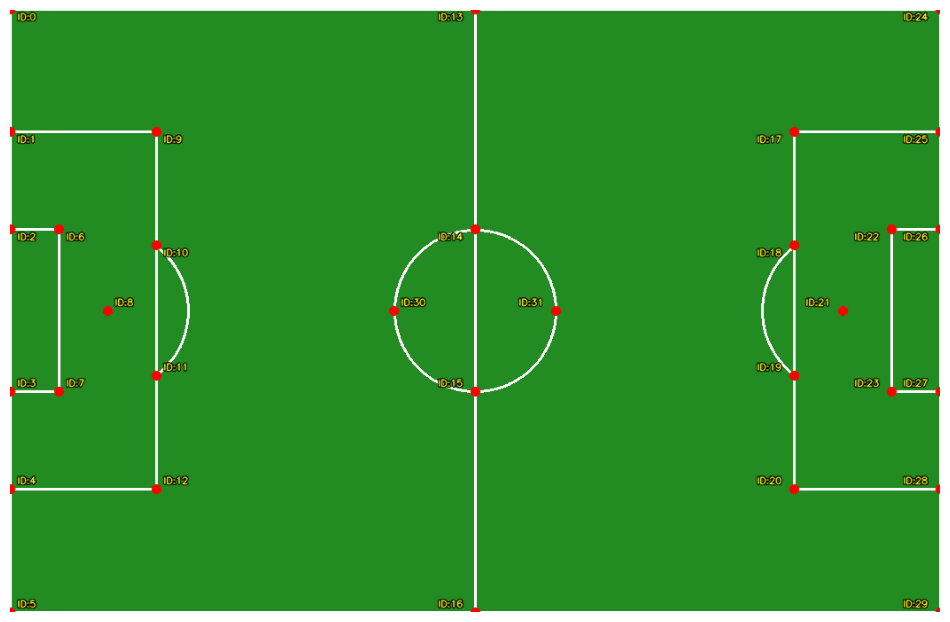

In [ ]:
def build_tactical_pitch_canvas(scale=10, width_m=105, height_m=68):
    """
    Generira proporcionalno 2D platno nogometnega igrišča z uradnimi oznakami
    in matematično natančnimi loki kazenskega prostora.
    """
    w_px = int(width_m * scale)
    h_px = int(height_m * scale)
    mid_y = int(h_px / 2)

    # Osnovno zeleno platno nogometnega igrišča
    pitch = np.zeros((h_px, w_px, 3), dtype=np.uint8)
    pitch[:] = (34, 139, 34)

    white = (255, 255, 255)
    line_thickness = 2

    # 1. Glavne zunanje črte in sredinska črta
    cv2.rectangle(pitch, (0, 0), (w_px, h_px), white, line_thickness)
    mid_x = int(w_px / 2)
    cv2.line(pitch, (mid_x, 0), (mid_x, h_px), white, line_thickness)

    # 2. Sredinski krog (polmer 9,15 m)
    circle_radius = int(9.15 * scale)
    cv2.circle(pitch, (mid_x, mid_y), circle_radius, white, line_thickness)

    # 3. Levi kazenski in vratarjev prostor
    box_deep = int(16.5 * scale)
    box_wide = int(40.32 * scale)
    box_top = int(((height_m - 40.32) / 2) * scale)
    box_bottom = box_top + box_wide
    cv2.rectangle(pitch, (0, box_top), (box_deep, box_bottom), white, line_thickness)

    g_deep = int(5.5 * scale)
    g_wide = int(18.32 * scale)
    g_top = int(((height_m - 18.32) / 2) * scale)
    g_bottom = g_top + g_wide
    cv2.rectangle(pitch, (0, g_top), (g_deep, g_bottom), white, line_thickness)

    # 4. Desni kazenski in vratarjev prostor
    cv2.rectangle(pitch, (w_px - box_deep, box_top), (w_px, box_bottom), white, line_thickness)
    cv2.rectangle(pitch, (w_px - g_deep, g_top), (w_px, g_bottom), white, line_thickness)

    # 5. Loki kazenskega prostora (s središčem na točki 11 m)
    arc_radius = int(9.15 * scale)

    # Levi lok kazenskega prostora (popravljen izris v obliki 'D' izven prostora)
    left_penalty_spot = (int(11 * scale), mid_y)
    cv2.ellipse(pitch, left_penalty_spot, (arc_radius, arc_radius),
                angle=0, startAngle=-53, endAngle=53, color=white, thickness=line_thickness)

    # Desni lok kazenskega prostora
    right_penalty_spot = (w_px - int(11 * scale), mid_y)
    cv2.ellipse(pitch, right_penalty_spot, (arc_radius, arc_radius),
                angle=0, startAngle=127, endAngle=233, color=white, thickness=line_thickness)

    # Izris točk za izvajanje kazenskih udarcev (11 m)
    cv2.circle(pitch, left_penalty_spot, int(0.5 * scale), white, -1)
    cv2.circle(pitch, right_penalty_spot, int(0.5 * scale), white, -1)

    return pitch


# --- PRESLIKAVA KLJUČNIH TOČK MODELA IGRIŠČA ---
MASTER_PITCH_TEMPLATE = {
    # === LEVA GOL ČRTA (0 do 5) ===
    0: [0.0, 0.0],       # Zgornji levi kot (zastavica)
    1: [0.0, 13.84],     # Levi kazenski prostor na gol črti (zgoraj)
    2: [0.0, 24.84],     # Levi vratarjev prostor na gol črti (zgoraj)
    3: [0.0, 43.16],     # Levi vratarjev prostor na gol črti (spodaj)
    4: [0.0, 54.16],     # Levi kazenski prostor na gol črti (spodaj)
    5: [0.0, 68.0],      # Spodnji levi kot (zastavica)

    # === LEVI KAZENSKI IN VRATARJEV PROSTOR (6 do 12) ===
    6: [5.5, 24.84],     # Zunanji zgornji kot levega vratarjevega prostora
    7: [5.5, 43.16],     # Zunanji spodnji kot levega vratarjevega prostora
    8: [11.0, 34.0],     # Leva točka 11m
    9: [16.5, 13.84],    # Zunanji zgornji kot levega kazenskega prostora
    10: [16.5, 26.68],   # Zgornji presek levega loka kazenskega prostora
    11: [16.5, 41.32],   # Spodnji presek levega loka kazenskega prostora
    12: [16.5, 54.16],   # Zunanji spodnji kot levega kazenskega prostora

    # === SREDINSKA ČRTA IN SREDINSKI KROG (13 do 16) ===
    13: [52.5, 0.0],     # Sredinska črta na zgornji stranski črti
    14: [52.5, 24.85],   # Zgornji presek sredinskega kroga
    15: [52.5, 43.15],   # Spodnji presek sredinskega kroga
    16: [52.5, 68.0],    # Sredinska črta na spodnji stranski črti

    # === DESNI KAZENSKI IN VRATARJEV PROSTOR (17 do 23) ===
    17: [88.5, 13.84],   # Zunanji zgornji kot desnega kazenskega prostora
    18: [88.5, 26.68],   # Zgornji presek desnega loka kazenskega prostora
    19: [88.5, 41.32],   # Spodnji presek desnega loka kazenskega prostora
    20: [88.5, 54.16],   # Zunanji spodnji kot desnega kazenskega prostora
    21: [105.0 - 11.0, 34.0], # Desna točka 11m (94.0m)
    22: [99.5, 24.84],   # Zunanji zgornji kot desnega vratarjevega prostora
    23: [99.5, 43.16],   # Zunanji spodnji kot desnega vratarjevega prostora

    # === DESNA GOL ČRTA (24 do 29) ===
    24: [105.0, 0.0],    # Zgornji desni kot (zastavica)
    25: [105.0, 13.84],  # Desni kazenski prostor na gol črti (zgoraj)
    26: [105.0, 24.84],  # Desni vratarjev prostor na gol črti (zgoraj)
    27: [105.0, 43.16],  # Desni vratarjev prostor na gol črti (spodaj)
    28: [105.0, 54.16],  # Desni kazenski prostor na gol črti (spodaj)
    29: [105.0, 68.0],   # Spodnji desni kot (zastavica)

    # === STRANSKI TANGENTI SREDINSKEGA KROGA (30 in 31) ===
    30: [52.5 - 9.15, 34.0],  # Leva zunanja tangenta sredinskega kroga (43.35m)
    31: [52.5 + 9.15, 34.0],  # Desna zunanja tangenta sredinskega kroga (61.65m)
}

# ── DEFINICIJA POVEZAV MED TOČKAMI ZA IZRIS MREŽE ────────────────────────────
PITCH_EDGES = [
    # -- Leva stran igrišča --
    (0, 1), (1, 2), (2, 3), (3, 4), (4, 5),      # Leva gol črta
    (0, 13), (5, 16),                            # Leve stranske črte
    (6, 7), (6, 2), (7, 3),                      # Levi vratarjev prostor
    (10, 9), (11, 12), (10, 11),                 # Lok levega kazenskega prostora
    (9, 1), (12, 4), (9, 12),                    # Zunanje meje levega kazenskega prostora

    # -- Sredina igrišča --
    (13, 14), (14, 15), (15, 16),                # Vertikalka sredinske črte
    (14, 30), (14, 31), (15, 30), (15, 31),      # Sredinski krog

    # -- Desna stran igrišča --
    (24, 25), (25, 26), (26, 27), (27, 28), (28, 29), # Desna gol črta
    (13, 24), (16, 29),                          # Desne stranske črte
    (22, 23), (22, 26), (23, 27),                # Desni vratarjev prostor
    (18, 17), (19, 20), (18, 19),                # Lok desnega kazenskega prostora
    (17, 25), (20, 28), (17, 20)                 # Zunanje meje desnega kazenskega prostora
]

# Generiranje osnovnega platna
scale_factor = 10
radar_pitch = build_tactical_pitch_canvas(scale=scale_factor)

# Prikaz vseh ključnih točk na predogledu igrišča
for model_id, coordinates in MASTER_PITCH_TEMPLATE.items():
    x_pixel = int(coordinates[0] * scale_factor)
    y_pixel = int(coordinates[1] * scale_factor)

    cv2.circle(radar_pitch, (x_pixel, y_pixel), 5, (0, 0, 255), -1, cv2.LINE_AA)

    shift_x = 8 if x_pixel < 525 else -42
    shift_y = 12 if y_pixel < 340 else -6

    display_label = f"ID:{model_id}"

    cv2.putText(radar_pitch, display_label, (x_pixel + shift_x, y_pixel + shift_y),
                cv2.FONT_HERSHEY_SIMPLEX, 0.35, (0, 0, 0), 2, cv2.LINE_AA)
    cv2.putText(radar_pitch, display_label, (x_pixel + shift_x, y_pixel + shift_y),
                cv2.FONT_HERSHEY_SIMPLEX, 0.35, (0, 255, 255), 1, cv2.LINE_AA)

output_image_path = "/content/full_pitch_decoded_map.png"
cv2.imwrite(output_image_path, radar_pitch)
print(f"Nova strukturna karta igrišča je bila uspešno ustvarjena na: {output_image_path}")

sv.plot_image(radar_pitch)

## Obdelava videoposnetka, izračun homografije in generiranje taktičnega radarja

In [ ]:
import cv2
import numpy as np
import pickle
import supervision as sv

# --- Nastavitve poti in parametrov ---
SOURCE_VIDEO_PATH       = "/content/int-como.mp4"
TARGET_VIDEO_PATH       = "/content/output_tactical_radar.mp4"
PROPAGATED_DB_PATH     = "/content/propagated_db.pkl"
LOCKED_ASSIGNMENTS_PATH = "/content/locked_track_assignments.pkl"
BALL_CACHE_PATH         = "/content/ball_positions.pkl"
WORLD_TELEMETRY_PATH    = "/content/world_telemetry.pkl"
KEYPOINTS_DB_PATH       = "/content/keypoints_db.pkl"  # <-- Dodana pot za shranjevanje keypointov

SCALE_M = 10
RADAR_W = int(105 * SCALE_M)
RADAR_H = int(68 * SCALE_M)


# --- Razred za stabilizacijo stične točke igralcev s tlemi ---
class PlayerFootStabilizer:
    def __init__(self, window_size=25, height_drop_threshold=0.12):
        self.window_size = window_size
        self.height_drop_threshold = height_drop_threshold
        self.track_history = {}

    def stabilize_foot_point(self, track_id, xyxy):
        xmin, ymin, xmax, ymax = xyxy
        current_w = xmax - xmin
        current_h = ymax - ymin

        if track_id not in self.track_history:
            self.track_history[track_id] = {"heights": [], "widths": []}
        hist = self.track_history[track_id]

        if len(hist["heights"]) < 5:
            hist["heights"].append(current_h)
            hist["widths"].append(current_w)
            return float((xmin + xmax) / 2.0), float(ymax)

        baseline_h = np.percentile(hist["heights"], 75)
        baseline_w = np.median(hist["widths"])

        has_height_dropped = current_h < (baseline_h * (1 - self.height_drop_threshold))
        is_width_stable = current_w >= (baseline_w * 0.75)

        if has_height_dropped and is_width_stable:
            stabilized_foot_y = float(ymin + baseline_h)
        else:
            stabilized_foot_y = float(ymax)
            hist["heights"].append(current_h)
            hist["widths"].append(current_w)
            if len(hist["heights"]) > self.window_size:
                hist["heights"].pop(0)
                hist["widths"].pop(0)

        foot_x = float((xmin + xmax) / 2.0)
        return foot_x, stabilized_foot_y


# --- Barvna shema za prikaz na radarju ---
DOT_COLORS = {
    "TEAM_0":  (232, 115,  26),
    "TEAM_1":  (  5, 188, 251),
    "REFEREE": ( 53,  67, 234),
    "BALL":    ( 52, 168,  83),
}

# --- Nalaganje podatkov o žogi in dodeljenih razredih ---
with open(BALL_CACHE_PATH, "rb") as f:
    ball_positions_db = pickle.load(f)

if "locked_track_assignments" not in locals():
    if os.path.exists(LOCKED_ASSIGNMENTS_PATH):
        with open(LOCKED_ASSIGNMENTS_PATH, "rb") as f:
            locked_track_assignments = pickle.load(f)
    else:
        locked_track_assignments = {}

# Uporaba funkcije iz prejšnje celice za ustvarjanje osnovnega platna radarja
base_radar = build_tactical_pitch_canvas(scale=SCALE_M)

# Linearna interpolacija za zapolnitev vrzel v podatkih sledenja
all_track_ids = set(t for f in propagated_db for t in propagated_db[f])
for t_idx in all_track_ids:
    track_frames = sorted([f for f in propagated_db if t_idx in propagated_db[f]])
    if len(track_frames) > 1:
        for i in range(len(track_frames) - 1):
            f_start, f_end = track_frames[i], track_frames[i + 1]
            gap = f_end - f_start
            if 1 < gap <= 90:
                box_start = np.array(propagated_db[f_start][t_idx]["xyxy"])
                box_end = np.array(propagated_db[f_end][t_idx]["xyxy"])
                for f in range(f_start + 1, f_end):
                    t = (f - f_start) / gap
                    interp_box = box_start + t * (box_end - box_start)
                    if f not in propagated_db:
                        propagated_db[f] = {}
                    propagated_db[f][t_idx] = {"xyxy": interp_box.tolist()}

# Priprava video bralnika in zapisovalnika
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_gen = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
COMBINED_W, COMBINED_H = video_info.width + RADAR_W, max(video_info.height, RADAR_H)
writer = cv2.VideoWriter(TARGET_VIDEO_PATH, cv2.VideoWriter_fourcc(*"mp4v"), video_info.fps, (COMBINED_W, COMBINED_H))

# Spremenljivke za glajenje matrike in koordinat
last_H, ALPHA, KP_SMOOTH = None, 0.15, 0.25
kp_history, player_world_history = {}, {}
PLAYER_SMOOTH, BALL_SMOOTH = 0.12, 0.25
foot_stabilizer = PlayerFootStabilizer()

world_telemetry_db = {}
keypoints_db = {}  # <-- Slovar za shranjevanje detektiranih keypointov

print("Začetek obdelave prostorskih matrik in generiranja taktičnega radarja...")

for frame_idx, frame in enumerate(frame_gen):
    radar = base_radar.copy()
    vis = frame.copy()
    world_telemetry_db[frame_idx] = {"ball": None, "players": {}}
    keypoints_db[frame_idx] = {}  # Inicijalizacija za trenutni okvir

    # Izračun homografije z modelom za lokalizacijo igrišča
    result = client.infer(frame, model_id=FIELD_MODEL_ID)
    if result.get("predictions") and len(result["predictions"]) > 0:
        raw_kps = result["predictions"][0]["keypoints"]
        frame_pts, pitch_pts = [], []
        for kp in raw_kps:
            if kp["confidence"] < 0.45:
                continue
            cid = kp["class_id"]
            if cid not in MASTER_PITCH_TEMPLATE:
                continue
            if cid not in kp_history:
                kp_history[cid] = (kp["x"], kp["y"])
            else:
                prev_x, prev_y = kp_history[cid]
                kp_history[cid] = ((KP_SMOOTH * kp["x"]) + ((1.0 - KP_SMOOTH) * prev_x),
                                   (KP_SMOOTH * kp["y"]) + ((1.0 - KP_SMOOTH) * prev_y))

            # --- DODANO: Shranjevanje zglajenih koordinat v keypoints_db ---
            keypoints_db[frame_idx][cid] = {
                "x": float(kp_history[cid][0]),
                "y": float(kp_history[cid][1]),
                "confidence": float(kp["confidence"])
            }

            frame_pts.append([kp_history[cid][0], kp_history[cid][1]])
            pitch_pts.append(MASTER_PITCH_TEMPLATE[cid])

        if len(frame_pts) >= 4:
            try:
                H, _ = cv2.findHomography(np.array(frame_pts, dtype=np.float32),
                                          np.array(pitch_pts, dtype=np.float32),
                                          cv2.RANSAC, 4.0)
                if H is not None:
                    last_H = H if last_H is None else (ALPHA * (H / H[2, 2])) + ((1.0 - ALPHA) * (last_H / last_H[2, 2]))
            except Exception:
                pass

    frame_data = propagated_db.get(frame_idx, {})
    ball_data = ball_positions_db.get(frame_idx)
    ball_pt = ball_data.get("position") if isinstance(ball_data, dict) else ball_data

    # Preslikava koordinat iz slike v metrični prostor igrišča
    if (frame_data or ball_pt) and last_H is not None:
        track_ids, screen_pts, colors, dot_radii = [], [], [], []
        for t_idx, data in frame_data.items():
            team_label = str(locked_track_assignments.get(t_idx, "")).upper()
            is_gk = t_idx >= 20000 or "GK" in team_label or "GOALKEEPER" in team_label

            if is_gk:
                xmin, ymin, xmax, ymax = data["xyxy"]
                t_x = float((xmin + xmax) / 2.0)
                t_y = float((ymin + ymax) / 2.0)
            else:
                t_x, t_y = foot_stabilizer.stabilize_foot_point(t_idx, data["xyxy"])

            team_key = locked_track_assignments.get(t_idx, "TEAM_0")
            track_ids.append(t_idx)
            screen_pts.append([t_x, t_y])
            colors.append(DOT_COLORS.get(team_key, (255, 255, 255)))
            dot_radii.append(6)

        if ball_pt is not None:
            track_ids.append(10000)
            screen_pts.append([float(ball_pt[0]), float(ball_pt[1])])
            colors.append(DOT_COLORS["BALL"])
            dot_radii.append(4)

        if screen_pts:
            pts_m = cv2.perspectiveTransform(np.array(screen_pts, dtype=np.float32).reshape(-1, 1, 2), last_H).reshape(-1, 2)
            for t_idx, raw_pt, color, radius in zip(track_ids, pts_m, colors, dot_radii):
                mx, my = raw_pt[0], raw_pt[1]
                current_smooth = BALL_SMOOTH if t_idx == 10000 else PLAYER_SMOOTH

                if t_idx not in player_world_history or (frame_idx - player_world_history[t_idx]["frame"]) > 2:
                    player_world_history[t_idx] = {"coords": (mx, my), "frame": frame_idx}
                else:
                    prev_mx, prev_my = player_world_history[t_idx]["coords"]
                    mx = (current_smooth * mx) + ((1.0 - current_smooth) * prev_mx)
                    my = (current_smooth * my) + ((1.0 - current_smooth) * prev_my)
                    player_world_history[t_idx] = {"coords": (mx, my), "frame": frame_idx}

                if t_idx == 10000:
                    world_telemetry_db[frame_idx]["ball"] = (mx, my)
                else:
                    world_telemetry_db[frame_idx]["players"][t_idx] = (mx, my)

                rx, ry = int(mx * SCALE_M), int(my * SCALE_M)
                if 0 <= rx < RADAR_W and 0 <= ry < RADAR_H:
                    cv2.circle(radar, (rx, ry), radius + 2, (0, 0, 0), -1, cv2.LINE_AA)
                    cv2.circle(radar, (rx, ry), radius, color, -1, cv2.LINE_AA)

    # Združevanje originalnega videa in taktičnega radarja
    output = np.zeros((COMBINED_H, COMBINED_W, 3), dtype=np.uint8)
    output[:video_info.height, :video_info.width] = vis
    output[:RADAR_H, video_info.width:] = radar
    writer.write(output)

writer.release()

# --- Shranjevanje prostorske telemetrije in keypointov ---
with open(WORLD_TELEMETRY_PATH, "wb") as f:
    pickle.dump(world_telemetry_db, f)

with open(KEYPOINTS_DB_PATH, "wb") as f:
    pickle.dump(keypoints_db, f)

print(f"✅ Telemetrični podatki so shranjeni v: {WORLD_TELEMETRY_PATH}")
print(f"✅ Keypointi so shranjeni v: {KEYPOINTS_DB_PATH}")

Začetek obdelave prostorskih matrik in generiranja taktičnega radarja...
✅ Telemetrični podatki so shranjeni v: /content/world_telemetry.pkl
✅ Keypointi so shranjeni v: /content/keypoints_db.pkl


## Detekcija in analiza dogodkov na tekmi (podaje, prestrezanja, streli)

In [ ]:
import pickle
import numpy as np

# ==============================================================================
# 1. KONFIGURACIJA IN POTI
# ==============================================================================
PROPAGATED_DB_PATH       = "/content/propagated_db.pkl"
BALL_CACHE_PATH          = "/content/ball_positions.pkl"
WORLD_TELEMETRY_PATH     = "/content/world_telemetry.pkl"
LOCKED_TRACK_ASSIGNMENTS = "/content/locked_track_assignments.pkl"
OUTPUT_EVENTS_LOG_PATH   = "/content/events_log.pkl"
POSSESSION_TIMELINE_PATH = "/content/possession_timeline.pkl"

FPS = 30.0

MAX_TOUCH_DISTANCE_PX   = 35.0
MIN_INFLECTION_ANGLE_DEG = 35.0
MIN_SPEED_CHANGE_RATIO  = 1.8

# Parametri za detekcijo strela
SHOT_SPEED_MIN_KMH       = 70.0   # Prilagojen prag za začetno hitrost žoge
PITCH_GOAL_X_LIMIT       = 52.5
GOAL_Y_CENTER            = 34.0   # Sredina igrišča po Y osi (0-68m)
GOAL_WIDTH               = 7.32
MAX_DIST_FROM_POST_M     = 12.0   # Dopustni odmik od vratnice (m)

# ==============================================================================
# 2. NALAGANJE PODATKOV IN POMOŽNE FUNKCIJE
# ==============================================================================
with open(PROPAGATED_DB_PATH, "rb") as f:
    tracked_db = pickle.load(f)
with open(BALL_CACHE_PATH, "rb") as f:
    ball_db = pickle.load(f)
with open(WORLD_TELEMETRY_PATH, "rb") as f:
    telemetry_db = pickle.load(f)

try:
    with open(LOCKED_TRACK_ASSIGNMENTS, "rb") as f:
        locked_assignments = pickle.load(f)
except FileNotFoundError:
    locked_assignments = {}

sorted_frames = sorted(tracked_db.keys())


def get_ball_pixel_pos(frame_idx):
    data = ball_db.get(frame_idx)
    if data is None:
        return None
    pos = data.get("position") if isinstance(data, dict) else data
    return tuple(pos) if pos is not None else None


def get_foot_point(box):
    x1, y1, x2, y2 = box
    return (x1 + x2) / 2.0, y2


def is_goalkeeper(player_id):
    if player_id is None:
        return False
    if player_id >= 20000:
        return True
    role = str(locked_assignments.get(player_id, "")).upper()
    return "GK" in role or "GOALKEEPER" in role


def is_referee(player_id):
    if player_id is None:
        return False
    role = str(locked_assignments.get(player_id, "")).upper()
    return "REFEREE" in role or "SODNIK" in role


def get_resolved_team(player_id):
    if player_id in locked_assignments:
        return locked_assignments[player_id]

    if is_goalkeeper(player_id):
        return "TEAM_1" if player_id >= 20050 else "TEAM_0"
    return "NEZNANA_EKIPA"


def find_nearest_player_to_ball(frame_idx, ball_pos):
    frame_data = tracked_db.get(frame_idx, {})
    best_id, best_dist = None, float("inf")
    for obj_id, data in frame_data.items():
        if obj_id == 10000 or is_referee(obj_id):
            continue
        foot_point = get_foot_point(data["xyxy"])
        dist = np.sqrt((foot_point[0] - ball_pos[0]) ** 2 + (foot_point[1] - ball_pos[1]) ** 2)
        if dist <= MAX_TOUCH_DISTANCE_PX and dist < best_dist:
            best_id, best_dist = obj_id, dist
    return best_id, best_dist


# ==============================================================================
# 3. KORAK 1: DETEKCIJA FIZIČNIH PRELOMOV TRAJEKTORIJE ŽOGE
# ==============================================================================
def detect_ball_touch_frames():
    touch_frames = []

    for i in range(2, len(sorted_frames) - 2):
        f_curr = sorted_frames[i]
        f_prev = sorted_frames[i - 2]
        f_next = sorted_frames[i + 2]

        p_prev = get_ball_pixel_pos(f_prev)
        p_curr = get_ball_pixel_pos(f_curr)
        p_next = get_ball_pixel_pos(f_next)

        if p_prev is None or p_curr is None or p_next is None:
            continue

        v_in = np.array([p_curr[0] - p_prev[0], p_curr[1] - p_prev[1]], dtype=np.float64)
        v_out = np.array([p_next[0] - p_curr[0], p_next[1] - p_curr[1]], dtype=np.float64)

        speed_in = np.linalg.norm(v_in)
        speed_out = np.linalg.norm(v_out)

        if speed_in < 0.5 and speed_out < 0.5:
            continue

        if speed_in >= 1.0 and speed_out >= 1.0:
            cos_angle = np.dot(v_in, v_out) / (speed_in * speed_out)
            angle_change = np.degrees(np.arccos(np.clip(cos_angle, -1.0, 1.0)))
        else:
            angle_change = 0.0

        speed_ratio = speed_out / max(0.1, speed_in)
        speed_changed = (speed_ratio >= MIN_SPEED_CHANGE_RATIO) or (speed_ratio <= (1.0 / MIN_SPEED_CHANGE_RATIO))

        if angle_change >= MIN_INFLECTION_ANGLE_DEG or speed_changed:
            touch_frames.append(f_curr)

    filtered_touches = []
    if touch_frames:
        curr_cluster = [touch_frames[0]]
        for f in touch_frames[1:]:
            if f - curr_cluster[-1] <= 3:
                curr_cluster.append(f)
            else:
                filtered_touches.append(curr_cluster[len(curr_cluster) // 2])
                curr_cluster = [f]
        filtered_touches.append(curr_cluster[len(curr_cluster) // 2])

    return filtered_touches


# ==============================================================================
# 4. FUNKCIJA CHECK_SHOT (MERJENJE HITROSTI TAKOJ PO IZPUSTU OD PODAJALCA)
# ==============================================================================
def check_shot(departure_frame, last_valid_frame,
               pitch_x_limit=PITCH_GOAL_X_LIMIT, goal_y_center=GOAL_Y_CENTER,
               goal_width=GOAL_WIDTH, max_dist_from_post_m=MAX_DIST_FROM_POST_M,
               min_shot_speed_kmh=SHOT_SPEED_MIN_KMH, fps=FPS):
    """
    Preveri hitrost žoge TAKOJ ob oddaji (v oknu 3-12 sličic po departure_frame).
    """
    p_start = telemetry_db.get(departure_frame, {}).get("ball")
    if p_start is None:
        return False, 0.0, "Manjkajo podatki telemetrije"

    # Ujamemo najvišjo hitrost žoge takoj po izpustu (v oknu od 3 do 12 sličic po udarcu)
    best_speed_kmh = 0.0
    for delta in range(3, 13):
        f_target = departure_frame + delta
        if f_target > last_valid_frame:
            break
        p_end = telemetry_db.get(f_target, {}).get("ball")
        if p_end is not None:
            dist_m = np.linalg.norm(np.array(p_end[:2]) - np.array(p_start[:2]))
            dt = delta / float(fps)
            speed = (dist_m / dt) * 3.6
            if speed > best_speed_kmh:
                best_speed_kmh = speed

    if best_speed_kmh < min_shot_speed_kmh:
        return False, best_speed_kmh, f"Hitrost prenizka ({best_speed_kmh:.1f} km/h)"

    # Smer poleta žoge na začetku
    fit_end = min(departure_frame + 12, last_valid_frame)
    pts = []
    for f in range(departure_frame, fit_end + 1):
        p = telemetry_db.get(f, {}).get("ball")
        if p is not None:
            pts.append(p[:2])

    if len(pts) < 2:
        return False, best_speed_kmh, "Ni dovolj točk"

    pts = np.array(pts)
    x0, y0 = pts[0][0], pts[0][1]
    v = pts[-1] - pts[0]
    dx, dy = v[0], v[1]

    if abs(dx) < 0.2:
        return False, best_speed_kmh, "Vzporedno gibanje"

    target_x = pitch_x_limit if dx > 0 else -pitch_x_limit
    t_goal = (target_x - x0) / dx

    if t_goal <= 0:
        return False, best_speed_kmh, "Žoga leti stran od gola"

    # Kotno odstopanje od smeri gola
    gx = target_x - x0
    gy = goal_y_center - y0
    ball_angle = np.degrees(np.arctan2(dy, dx))
    goal_angle = np.degrees(np.arctan2(gy, gx))

    angle_diff = abs(ball_angle - goal_angle)
    while angle_diff > 180.0:
        angle_diff = 360.0 - angle_diff

    if angle_diff > 45.0:
        return False, best_speed_kmh, f"Kot odstopa ({angle_diff:.1f}°)"

    # Sečišče na gol liniji
    y_intersection = y0 + t_goal * dy
    half_goal = goal_width / 2.0
    max_allowed_dist = half_goal + max_dist_from_post_m
    y_offset = abs(y_intersection - goal_y_center)

    if y_offset <= max_allowed_dist:
        is_on_target = (y_offset <= half_goal)
        desc = "v okvir" if is_on_target else "mimo gola"
        return True, best_speed_kmh, f"STREL {desc} ({best_speed_kmh:.1f} km/h, frame {departure_frame})"

    return False, best_speed_kmh, f"Zgrešil gol (Odmik {y_offset:.1f}m od gola)"


# ==============================================================================
# 5. GLAVNA ZANKA PROCESIRANJA
# ==============================================================================
touch_frames = detect_ball_touch_frames()

possession_timeline = {}
switch_events = []
shot_events = []

current_possessor = None
last_contact_frame = None
shot_checked_for_departure = False
last_valid_frame = sorted_frames[-1]

print("=== POTRJEVA MENJAV POSLESTI IN ZAZNAVA STRELOV ===")
print(f"{'Sličica':>8} | {'Dogodek':>12} | {'Igralec':>10} | {'Podrobnosti':>30}")
print("-" * 68)

for frame_idx in sorted_frames:
    ball_pos = get_ball_pixel_pos(frame_idx)

    if current_possessor is None and ball_pos is not None:
        bootstrap_id, bootstrap_dist = find_nearest_player_to_ball(frame_idx, ball_pos)
        if bootstrap_id is not None:
            current_possessor = bootstrap_id
            last_contact_frame = frame_idx
            shot_checked_for_departure = False
            print(f"{frame_idx:>8} | {'ZAČETEK':>12} | {bootstrap_id:>10} | "
                  f"Začetna posest (razdalja {bootstrap_dist:.1f}px)")

    if current_possessor is not None and ball_pos is not None:
        frame_data = tracked_db.get(frame_idx, {})
        p_data = frame_data.get(current_possessor)
        if p_data:
            foot_pt = get_foot_point(p_data["xyxy"])
            dist = np.sqrt((foot_pt[0] - ball_pos[0]) ** 2 + (foot_pt[1] - ball_pos[1]) ** 2)
            if dist <= MAX_TOUCH_DISTANCE_PX:
                last_contact_frame = frame_idx
                shot_checked_for_departure = False

    if frame_idx in touch_frames and ball_pos is not None:
        best_id, best_dist = find_nearest_player_to_ball(frame_idx, ball_pos)

        if best_id is not None and best_id != current_possessor:
            if current_possessor is not None and last_contact_frame is not None and not shot_checked_for_departure:
                is_shot, speed_kmh, direction = check_shot(last_contact_frame, last_valid_frame)
                if is_shot:
                    print(f"{last_contact_frame:>8} | {'STREL':>12} | {current_possessor:>10} | {direction}")
                    shot_events.append({
                        "type": "STREL",
                        "player": current_possessor,
                        "frame": last_contact_frame,
                        "speed_kmh": round(speed_kmh, 1),
                        "direction": direction,
                    })
                shot_checked_for_departure = True

            if current_possessor is not None:
                switch_events.append((frame_idx, current_possessor, best_id))
                print(f"{frame_idx:>8} | {'MENJAVA':>12} | {current_possessor:>4} -> {best_id:<4} | Razdalja: {best_dist:.1f}px")

            current_possessor = best_id
            last_contact_frame = frame_idx
            shot_checked_for_departure = False

    # Takoj ko gre žoga stran od podajalca (3 sličice brez dotika), preverimo hitrost poleta
    if current_possessor is not None and not shot_checked_for_departure and last_contact_frame is not None:
        if (frame_idx - last_contact_frame) >= 3:
            is_shot, speed_kmh, direction = check_shot(last_contact_frame, last_valid_frame)
            if is_shot:
                print(f"{last_contact_frame:>8} | {'STREL':>12} | {current_possessor:>10} | {direction}")
                shot_events.append({
                    "type": "STREL",
                    "player": current_possessor,
                    "frame": last_contact_frame,
                    "speed_kmh": round(speed_kmh, 1),
                    "direction": direction,
                })
            shot_checked_for_departure = True

    possession_timeline[frame_idx] = current_possessor

# ==============================================================================
# 6. SHRANJEVANJE REZULTATOV IN PRAVILNO RAZVRŠČANJE DOGODKOV
# ==============================================================================
events_log = []

for shot in shot_events:
    events_log.append({
        "type": "STREL",
        "frame": shot["frame"],
        "passer": shot["player"],
        "passer_team": get_resolved_team(shot["player"]),
        "receiver": None,
        "receiver_team": None,
        "speed_kmh": shot["speed_kmh"],
    })

for frame_idx, prev_id, new_id in switch_events:
    passer_team = get_resolved_team(prev_id)
    receiver_team = get_resolved_team(new_id)

    was_following_shot = any(
        s["player"] == prev_id and s["frame"] <= frame_idx and (frame_idx - s["frame"]) <= 120
        for s in shot_events
    )

    if was_following_shot:
        event_type = "OBRAMBA_GK" if is_goalkeeper(new_id) else "PRESTREZANJE"
    else:
        event_type = "PODAJA" if passer_team == receiver_team else "PRESTREZANJE"

    events_log.append({
        "type": event_type,
        "frame": frame_idx,
        "passer": prev_id,
        "passer_team": passer_team,
        "receiver": new_id,
        "receiver_team": receiver_team,
        "speed_kmh": None,
    })

events_log.sort(key=lambda e: e["frame"])

with open(OUTPUT_EVENTS_LOG_PATH, "wb") as f:
    pickle.dump(events_log, f)

with open(POSSESSION_TIMELINE_PATH, "wb") as f:
    pickle.dump(possession_timeline, f)

print("\n" + "=" * 68)
print(f"Zaznanih menjav posesti: {len(switch_events)}")
print(f"Zaznanih veljavnih strelov: {len(shot_events)}")
print(f"Shranjenih {len(events_log)} dogodkov v {OUTPUT_EVENTS_LOG_PATH}")

=== POTRJEVA MENJAV POSLESTI IN ZAZNAVA STRELOV ===
 Sličica |      Dogodek |    Igralec |                    Podrobnosti
--------------------------------------------------------------------
      93 |      ZAČETEK |          0 | Začetna posest (razdalja 33.0px)
     146 |      MENJAVA |    0 -> 9    | Razdalja: 14.3px

Zaznanih menjav posesti: 1
Zaznanih veljavnih strelov: 0
Shranjenih 1 dogodkov v /content/events_log.pkl


## Generiranje končnega videoposnetka z grafičnim vmesnikom (HUD) in taktičnim radarjem

In [ ]:
# --- Nastavitve poti in parametrov prikaza ---
TARGET_VIDEO_PATH        = "/content/output_presentation.mp4"
POSSESSION_TIMELINE_PATH = "/content/possession_timeline.pkl"
SOURCE_VIDEO_PATH = "/content/bay-psg.mp4"

SIDEBAR_W   = 420
RADAR_SCALE = 4.0
RADAR_ALPHA = 0.45

PAD_X = 4.0
PAD_Y = 4.0

# --- Barvna paleta (BGR) ---
BG_COLOR        = (24, 20, 18)
BG_COLOR_TOP    = (30, 26, 22)
CARD_BG         = (36, 32, 28)
CARD_BORDER     = (55, 50, 44)
ACCENT_GOLD     = (15, 188, 251)
TEXT_MUTED      = (150, 150, 150)
TEXT_BRIGHT     = (235, 235, 235)
POSSESSION_RING = (0, 255, 120)

TEAM_COLORS = {
    "TEAM_0":  (232, 115,  26),
    "TEAM_1":  (251, 188,   5),
    "REFEREE": ( 53,  67, 234),
    "BALL":    (  0, 240, 255),
}

EVENT_BADGES = {
    "POSSESSION":   ("POSEST",   (110, 100,  90)),
    "PODAJA":       ("PODAJA",   ( 45, 140,  50)),
    "PRESTREZANJE": ("PRESTREZ", ( 30, 150, 220)),
    "STREL":        ("STREL",    ( 40,  40, 230)),
}

# --- 1. Nalaganje podatkovnih virov ---
print("Nalaganje podatkov sledenja, prostorske telemetrije, posesti in dnevnika dogodkov...")
with open(BALL_CACHE_PATH, "rb") as f: ball_positions_db = pickle.load(f)
with open(PROPAGATED_DB_PATH, "rb") as f: propagated_db = pickle.load(f)
with open(LOCKED_ASSIGNMENTS_PATH, "rb") as f: locked_assignments = pickle.load(f)
with open(WORLD_TELEMETRY_PATH, "rb") as f: telemetry_db = pickle.load(f)
with open(OUTPUT_EVENTS_LOG_PATH, "rb") as f: events_log = pickle.load(f)
with open(POSSESSION_TIMELINE_PATH, "rb") as f: possession_timeline = pickle.load(f)

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_gen  = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
total_frames = int(video_info.total_frames) if video_info.total_frames else 1000

COMBINED_W = video_info.width + SIDEBAR_W
COMBINED_H = video_info.height
writer = cv2.VideoWriter(TARGET_VIDEO_PATH, cv2.VideoWriter_fourcc(*"mp4v"), video_info.fps, (COMBINED_W, COMBINED_H))


# --- 2. Generator taktičnega radarja (nespremenjen) ---
def generate_radar_canvas(frame_idx):
    p_w, p_h = 105.0, 68.0
    canvas_w_m = p_w + (2 * PAD_X)
    canvas_h_m = p_h + (2 * PAD_Y)
    w_px = int(canvas_w_m * RADAR_SCALE)
    h_px = int(canvas_h_m * RADAR_SCALE)

    radar = np.zeros((h_px, w_px, 3), dtype=np.uint8)
    radar[:] = (40, 45, 35)

    def to_px(x, y):
        return (int((x + PAD_X) * RADAR_SCALE), int((y + PAD_Y) * RADAR_SCALE))

    white = (200, 200, 200)
    cv2.rectangle(radar, to_px(0, 0), to_px(p_w, p_h), white, 1, cv2.LINE_AA)
    cv2.line(radar, to_px(p_w / 2, 0), to_px(p_w / 2, p_h), white, 1, cv2.LINE_AA)
    cv2.circle(radar, to_px(p_w / 2, p_h / 2), int(9.15 * RADAR_SCALE), white, 1, cv2.LINE_AA)
    cv2.circle(radar, to_px(p_w / 2, p_h / 2), 2, white, -1, cv2.LINE_AA)
    cv2.rectangle(radar, to_px(0, 13.84), to_px(16.5, 54.16), white, 1, cv2.LINE_AA)
    cv2.rectangle(radar, to_px(p_w - 16.5, 13.84), to_px(p_w, 54.16), white, 1, cv2.LINE_AA)
    cv2.rectangle(radar, to_px(0, 24.84), to_px(5.5, 43.16), white, 1, cv2.LINE_AA)
    cv2.rectangle(radar, to_px(p_w - 5.5, 24.84), to_px(p_w, 43.16), white, 1, cv2.LINE_AA)
    cv2.circle(radar, to_px(11.0, 34.0), 2, white, -1, cv2.LINE_AA)
    cv2.circle(radar, to_px(p_w - 11.0, 34.0), 2, white, -1, cv2.LINE_AA)

    left_spot_px = to_px(11.0, 34.0)
    right_spot_px = to_px(p_w - 11.0, 34.0)
    arc_radius_px = int(9.15 * RADAR_SCALE)
    cv2.ellipse(radar, left_spot_px, (arc_radius_px, arc_radius_px), 0, -53, 53, white, 1, cv2.LINE_AA)
    cv2.ellipse(radar, right_spot_px, (arc_radius_px, arc_radius_px), 0, 127, 233, white, 1, cv2.LINE_AA)

    f_telemetry = telemetry_db.get(frame_idx, {"ball": None, "players": {}})
    for p_id, coords in f_telemetry.get("players", {}).items():
        mx, my = coords[0], coords[1]
        t_key = locked_assignments.get(p_id, "TEAM_0")
        is_gk = p_id >= 20000 or "GK" in str(t_key).upper() or "GOALKEEPER" in str(t_key).upper()
        if is_gk:
            mx = np.clip(mx, 0.2, p_w - 0.2)
            my = np.clip(my, 0.2, p_h - 0.2)
        rx, ry = to_px(mx, my)
        if 0 <= rx < w_px and 0 <= ry < h_px:
            col = TEAM_COLORS["REFEREE"] if is_gk else TEAM_COLORS.get(t_key, (255, 255, 255))
            cv2.circle(radar, (rx, ry), 4, (0, 0, 0), -1, cv2.LINE_AA)
            cv2.circle(radar, (rx, ry), 3, col, -1, cv2.LINE_AA)

    b_coords = f_telemetry.get("ball")
    if b_coords:
        bx, by = to_px(b_coords[0], b_coords[1])
        if 0 <= bx < w_px and 0 <= by < h_px:
            cv2.circle(radar, (bx, by), 4, (0, 0, 0), -1, cv2.LINE_AA)
            cv2.circle(radar, (bx, by), 3, TEAM_COLORS["BALL"], -1, cv2.LINE_AA)

    return radar


# --- 3. Priprava časovnice dogodkov za prikaz v stranskem panelu ---
def format_event_text(e):
    if e["type"] == "PODAJA":
        return f"Igralec {e['passer']} -> Igralec {e['receiver']}"
    if e["type"] == "PRESTREZANJE":
        return f"Igralec {e['receiver']} prestreze od {e['passer'] if e['passer'] is not None else '?'}"
    if e["type"] == "STREL":
        speed_txt = f" ({e['speed_kmh']:.0f} km/h)" if e.get("speed_kmh") else ""
        return f"Igralec {e['passer']} - Strel na gol{speed_txt}"
    return f"Akcija igralca {e.get('passer')}"

timeline_triggers = []
last_team = None

for e in events_log:
    p_team = e.get("passer_team")
    if p_team is not None and p_team != last_team:
        team_lbl = "EKIPA 0" if p_team == "TEAM_0" else "EKIPA 1"
        timeline_triggers.append({
            "frame": e["frame"],
            "text": f"{team_lbl}: v posesti",
            "type": "POSSESSION",
            "team": p_team,
        })
        last_team = p_team

    timeline_triggers.append({
        "frame": e["frame"],
        "text": format_event_text(e),
        "type": e["type"],
        "team": p_team,
    })

timeline_triggers.sort(key=lambda t: t["frame"])

# --- Delež posesti žoge skozi čas, na podlagi dejanske ekipe posestnika ---
frame_to_active_team = {}
curr_t = None
for f in range(total_frames):
    possessor_id = possession_timeline.get(f)
    if possessor_id is not None:
        curr_t = locked_assignments.get(possessor_id, curr_t)
    frame_to_active_team[f] = curr_t if curr_t is not None else "TEAM_0"

possession_splits = {}
t0_c, t1_c = 0, 0
for f in range(total_frames):
    if frame_to_active_team.get(f, "TEAM_0") == "TEAM_0":
        t0_c += 1
    else:
        t1_c += 1
    tot = t0_c + t1_c
    p0 = (t0_c / tot) * 100 if tot > 0 else 50.0
    possession_splits[f] = (p0, 100.0 - p0)


# --- 4. Pomožne funkcije za estetski stranski panel ---
def draw_rounded_rect(img, pt1, pt2, color, radius=8, thickness=-1):
    x1, y1 = pt1
    x2, y2 = pt2
    if thickness < 0:
        cv2.rectangle(img, (x1 + radius, y1), (x2 - radius, y2), color, -1, cv2.LINE_AA)
        cv2.rectangle(img, (x1, y1 + radius), (x2, y2 - radius), color, -1, cv2.LINE_AA)
        for cx, cy in [(x1 + radius, y1 + radius), (x2 - radius, y1 + radius),
                       (x1 + radius, y2 - radius), (x2 - radius, y2 - radius)]:
            cv2.circle(img, (cx, cy), radius, color, -1, cv2.LINE_AA)
    else:
        cv2.rectangle(img, pt1, pt2, color, thickness, cv2.LINE_AA)


def draw_vertical_gradient(img, color_top, color_bottom):
    h, w = img.shape[:2]
    for y in range(h):
        t = y / max(1, h - 1)
        col = tuple(int(color_top[i] * (1 - t) + color_bottom[i] * t) for i in range(3))
        cv2.line(img, (0, y), (w, y), col, 1)


# --- 5. Glavna zanka za zrisovanje in renderiranje ---
print("Generiranje končnega videa z napredno grafično analitiko...")
for frame_idx, frame in enumerate(frame_gen):
    vis = frame.copy()
    f_players = propagated_db.get(frame_idx, {})
    ball_data = ball_positions_db.get(frame_idx)
    ball_pt = ball_data.get("position") if isinstance(ball_data, dict) else ball_data

    # Dejanski posestnik za to sličico -- SAMO iz possession_timeline,
    # ne iz gole bližine žogi. To zagotavlja, da se elipsa izriše zgolj
    # okoli igralca, ki je resnično v posesti (potrjeno s podajo,
    # prestrezbo ali strelom), ne okoli vsakega, ki se je znašel blizu žoge.
    current_possessor_id = possession_timeline.get(frame_idx)

    # Zrisovanje oznak nad igralci in elipse okoli igralca, ki je dejansko v posesti
    for t_idx, data in f_players.items():
        xmin, ymin, xmax, ymax = data["xyxy"]
        x_mid = int((xmin + xmax) / 2.0)
        team_key = locked_assignments.get(t_idx, "TEAM_0")
        col = TEAM_COLORS.get(team_key, (255, 255, 255))

        if t_idx >= 20000 or "GK" in str(team_key).upper():
            col = TEAM_COLORS["REFEREE"]

        if t_idx == current_possessor_id:
            ew, eh = int((xmax - xmin) * 0.7), int((xmax - xmin) * 0.25)
            cv2.ellipse(vis, (x_mid, int(ymax)), (ew, eh), 0, 0, 360, (0, 0, 0), 3, cv2.LINE_AA)
            cv2.ellipse(vis, (x_mid, int(ymax)), (ew, eh), 0, 0, 360, POSSESSION_RING, 2, cv2.LINE_AA)

        tri_size, tri_y = 7, int(ymin - 10)
        pt1, pt2, pt3 = (x_mid, tri_y), (x_mid - tri_size, tri_y - tri_size), (x_mid + tri_size, tri_y - tri_size)
        cv2.drawContours(vis, [np.array([pt1, pt2, pt3])], 0, col, -1)
        cv2.drawContours(vis, [np.array([pt1, pt2, pt3])], 0, (0, 0, 0), 1, cv2.LINE_AA)

    if ball_pt is not None:
        cv2.circle(vis, (int(ball_pt[0]), int(ball_pt[1])), 8, TEAM_COLORS["BALL"], 1, cv2.LINE_AA)

    # --- Prekritje taktičnega radarja na dnu videa ---
    radar_map = generate_radar_canvas(frame_idx)
    rm_h, rm_w, _ = radar_map.shape

    x_start = (video_info.width - rm_w) // 2
    y_start = video_info.height - rm_h - 25
    x_end, y_end = x_start + rm_w, y_start + rm_h

    bg_roi = vis[y_start:y_end, x_start:x_end]
    blended_radar = cv2.addWeighted(bg_roi, 1.0 - RADAR_ALPHA, radar_map, RADAR_ALPHA, 0)
    vis[y_start:y_end, x_start:x_end] = blended_radar
    cv2.rectangle(vis, (x_start, y_start), (x_end, y_end), (100, 100, 100), 1, cv2.LINE_AA)

    # --- 6. Stranski analitični panel (HUD) ---
    sidebar = np.zeros((COMBINED_H, SIDEBAR_W, 3), dtype=np.uint8)
    draw_vertical_gradient(sidebar, BG_COLOR_TOP, BG_COLOR)

    # Naslovna kartica
    draw_rounded_rect(sidebar, (20, 25), (SIDEBAR_W - 20, 78), CARD_BG, radius=10)
    cv2.rectangle(sidebar, (20, 25), (SIDEBAR_W - 20, 78), CARD_BORDER, 1, cv2.LINE_AA)
    cv2.line(sidebar, (20, 25), (20, 78), ACCENT_GOLD, 3, cv2.LINE_AA)
    cv2.putText(sidebar, "TAKTICNI ANALITICNI ENGINE", (40, 46), cv2.FONT_HERSHEY_DUPLEX, 0.46, TEXT_BRIGHT, 1, cv2.LINE_AA)
    cv2.putText(sidebar, f"SLICICA {frame_idx}", (40, 66), cv2.FONT_HERSHEY_SIMPLEX, 0.34, TEXT_MUTED, 1, cv2.LINE_AA)

    # Kartica posesti žoge
    p0, p1 = possession_splits.get(frame_idx, (50.0, 50.0))
    card_y1, card_y2 = 96, 168
    draw_rounded_rect(sidebar, (20, card_y1), (SIDEBAR_W - 20, card_y2), CARD_BG, radius=10)
    cv2.rectangle(sidebar, (20, card_y1), (SIDEBAR_W - 20, card_y2), CARD_BORDER, 1, cv2.LINE_AA)
    cv2.putText(sidebar, "POSEST ZOGE", (35, card_y1 + 24), cv2.FONT_HERSHEY_SIMPLEX, 0.4, TEXT_MUTED, 1, cv2.LINE_AA)

    bx, by, bw, bh = 35, card_y1 + 40, SIDEBAR_W - 70, 16
    draw_rounded_rect(sidebar, (bx, by), (bx + bw, by + bh), (55, 50, 45), radius=8)
    split_w = int(bw * (p0 / 100.0))
    if split_w > 0:
        draw_rounded_rect(sidebar, (bx, by), (bx + split_w, by + bh), TEAM_COLORS["TEAM_0"], radius=8)
    if bw - split_w > 0:
        draw_rounded_rect(sidebar, (bx + split_w, by), (bx + bw, by + bh), TEAM_COLORS["TEAM_1"], radius=8)

    cv2.putText(sidebar, f"EKIPA 0  {int(p0)}%", (bx, by + bh + 20), cv2.FONT_HERSHEY_SIMPLEX, 0.36, TEAM_COLORS["TEAM_0"], 1, cv2.LINE_AA)
    p1_txt = f"EKIPA 1  {int(p1)}%"
    text_w = cv2.getTextSize(p1_txt, cv2.FONT_HERSHEY_SIMPLEX, 0.36, 1)[0][0]
    cv2.putText(sidebar, p1_txt, (bx + bw - text_w, by + bh + 20), cv2.FONT_HERSHEY_SIMPLEX, 0.36, TEAM_COLORS["TEAM_1"], 1, cv2.LINE_AA)

    # Seznam dogodkov v živo
    cv2.putText(sidebar, "DOGODKI V ZIVO", (20, 200), cv2.FONT_HERSHEY_SIMPLEX, 0.42, TEXT_MUTED, 1, cv2.LINE_AA)
    cv2.line(sidebar, (20, 210), (SIDEBAR_W - 20, 210), CARD_BORDER, 1, cv2.LINE_AA)

    active_triggers = [t for t in timeline_triggers if t["frame"] <= frame_idx]
    visible_triggers = active_triggers[-7:]

    start_y = 225
    card_h = 54
    gap = 10

    for rank, trig in enumerate(visible_triggers):
        item_y = start_y + (rank * (card_h + gap))
        is_latest = rank == len(visible_triggers) - 1
        badge_txt, badge_col = EVENT_BADGES.get(trig["type"], ("DOGODEK", (100, 100, 100)))

        opacity_weight = 0.4 + 0.6 * ((rank + 1) / len(visible_triggers))
        card_col = tuple(int(c * opacity_weight) for c in CARD_BG)

        draw_rounded_rect(sidebar, (20, item_y), (SIDEBAR_W - 20, item_y + card_h), card_col, radius=8)
        border_col = ACCENT_GOLD if is_latest else CARD_BORDER
        cv2.rectangle(sidebar, (20, item_y), (SIDEBAR_W - 20, item_y + card_h), border_col, 1 if not is_latest else 2, cv2.LINE_AA)

        badge_col_scaled = tuple(int(c * opacity_weight) for c in badge_col)
        bx1, by1 = 34, item_y + 11
        bx2, by2 = bx1 + 84, by1 + 17
        draw_rounded_rect(sidebar, (bx1, by1), (bx2, by2), badge_col_scaled, radius=6)
        cv2.putText(sidebar, badge_txt, (bx1 + 8, by1 + 13), cv2.FONT_HERSHEY_SIMPLEX, 0.32, TEXT_BRIGHT, 1, cv2.LINE_AA)

        text_color = tuple(int(c * opacity_weight) for c in TEXT_BRIGHT)
        cv2.putText(sidebar, trig["text"], (bx1, by2 + 20), cv2.FONT_HERSHEY_SIMPLEX, 0.37, text_color, 1, cv2.LINE_AA)

    # --- 7. Združevanje videa in stranskega panela ---
    output_canvas = np.zeros((COMBINED_H, COMBINED_W, 3), dtype=np.uint8)
    output_canvas[:video_info.height, :video_info.width] = vis
    output_canvas[:COMBINED_H, video_info.width:] = sidebar
    writer.write(output_canvas)

writer.release()
print(f"Obdelava je zaključena. Koncni video posnetek je shranjen v: {TARGET_VIDEO_PATH}")

Nalaganje podatkov sledenja, prostorske telemetrije, posesti in dnevnika dogodkov...


Exception: Could not open video at /content/bay-psg.mp4